## Plasticty model 2
Rebuilding the full plasticity sim as of 02/06/2025 to find the bug in the code that prevents me from running a compression sim with TETs.

In [34]:
# Import some useful modules.
import jax
import jax.numpy as np
import os
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
from units_constants import ConversionFactors as uc


# Import JAX-FEM specific modules.
from jax_fem.problem import Problem
from jax_fem.solver import solver
from jax_fem.utils import save_sol
from jax_fem.generate_mesh import box_mesh_gmsh, get_meshio_cell_type, Mesh
from jax.experimental import host_callback

In [35]:
# Define constitutive relationship.
class Plasticity(Problem):
    # The function 'get_tensor_map' overrides base class method. Generally, JAX-FEM 
    # solves -div(f(u_grad,alpha_1,alpha_2,...,alpha_N)) = b. Here, we have 
    # f(u_grad,alpha_1,alpha_2,...,alpha_N) = sigma_crt(u_crt_grad, epsilon_old, sigma_old),
    # reflected by the function 'stress_return_map'
    def custom_init(self, E_factor, cs_eff, nu):
        # Override base class method.
        # Initializing total strain and stress.
        self.fe = self.fes[0]
        self.epsilons_old = np.zeros((len(self.fe.cells), self.fe.num_quads, self.fe.vec, self.dim))
        self.sigmas_old = np.zeros_like(self.epsilons_old)
        self.Y = np.zeros_like(self.epsilons_old)
        
        # self.density = dens # fails bc. wrong shape
        self.density = np.zeros((len(self.fe.cells), self.fe.num_quads))#+2e-3 # should work for uniform density
        self.cs = cs_eff
        # elasticity coefficients
        self.E_factor = E_factor
        self.nu = nu
        self.upd_f_yield = None


        self.internal_vars = [self.sigmas_old, self.epsilons_old, self.density]

    def get_tensor_map(self):
        # Override base class method.
        _, stress_return_map = self.get_maps()
        return stress_return_map

    def get_maps(self):
        def safe_sqrt(x):  
            # np.sqrt is not differentiable at 0
            safe_x = np.where(x > 0., np.sqrt(x), 0.)
            return safe_x

        def safe_divide(x, y):
            return np.where(y == 0., 0., x/y)

        def strain(u_grad):
            epsilon = 0.5*(u_grad + u_grad.T)
            return epsilon

        # def stress(epsilon):
        #     E = 
        #     nu = 0.05
        #     mu = E/(2.*(1. + nu))
        #     lmbda = E*nu/((1+nu)*(1-2*nu))
        #     sigma = lmbda*np.trace(epsilon)*np.eye(self.dim) + 2*mu*epsilon
        #     return sigma
        def stress(eps, E):
            return E*self.nu/((1+self.nu)*(1-2*self.nu))*np.trace(eps)*np.eye(self.dim) + 2*E/(2.*(1. + self.nu))*eps
        
        def E_calc(density):
            # question is, can I call this outside the problem?
            # no need, just set E_Factor and nu outside and then calculate again. Not efficient, but straightforward.
            return self.E_factor*density
        
        def E_calc_cs(density):
            return self.cs**2 * density

        
        def Y_comp(density):
            """Calculates the compressive strength of a material as a function of volume filling factor for homogeneous, monodisperse monomers. Adapted from Tatsuuma et al. 2023.
            The equation takes the density rather than volume filling factor as input. 

            Args:
                density (float, array-like): N dim. array of cell volumes

            Returns:
                float, array-like: compressive strength of each cell in the material
            """
            Y = (Eroll/(rs**3)) * ((rho_m/density) - 1/phi_max)**(-3)

            return Y

        def stress_return_map(u_grad, sigma_old, epsilon_old, density):
            E = E_calc(density)
            #E = E_calc_cs(density) # E = constant * density
            Y = Y_comp(density)
            
            epsilon_crt = strain(u_grad)
            epsilon_inc = epsilon_crt - epsilon_old
            sigma_trial = stress(epsilon_inc, E) + sigma_old
            s_dev = sigma_trial - 1./self.dim*np.trace(sigma_trial)*np.eye(self.dim)
            s_norm = safe_sqrt(3./2.*np.sum(s_dev*s_dev))
            f_yield = s_norm - Y
            #print("Before correction: ", f_yield)
            f_yield_plus = np.where(f_yield > 0., f_yield, 0.)
            sigma = sigma_trial - safe_divide(f_yield_plus*s_dev, s_norm)

            # check final yield func - should be zero
            upd_s_dev = sigma - 1./self.dim*np.trace(sigma)*np.eye(self.dim)
            upd_s_norm = safe_sqrt(3./2.*np.sum(upd_s_dev*upd_s_dev))
            upd_f_yield = upd_s_norm - Y
            
            # tap(upd_f_yield)
            
            print("After correction: ", upd_f_yield)
            #jax.debug.print("Intercepted value: {}", upd_f_yield)
            self.upd_f_yield = upd_f_yield
            # np.save(upd_f_yield.val, 'f_yield.npy')
            # print(np.load('f_yield.npy'))
            #print("Sum of f_yield: ", np.sum(f_yield)) 
            return sigma
        return strain, stress_return_map

    def stress_strain_fns(self):
        strain, stress_return_map = self.get_maps()
        vmap_strain = jax.vmap(jax.vmap(strain))
        vmap_stress_return_map = jax.vmap(jax.vmap(stress_return_map))
        return vmap_strain, vmap_stress_return_map

    def update_stress_strain(self, sol):
        u_grads = self.fe.sol_to_grad(sol)
        vmap_strain, vmap_stress_rm = self.stress_strain_fns()
        self.sigmas_old = vmap_stress_rm(u_grads, self.sigmas_old, self.epsilons_old, self.density)
        self.epsilons_old = vmap_strain(u_grads)
        self.internal_vars = [self.sigmas_old, self.epsilons_old, self.density]
        print(self.sigmas_old.shape, self.epsilons_old.shape, self.density.shape)

    def compute_avg_stress(self):
        # For post-processing only: Compute volume averaged stress.
        # (num_cells*num_quads, vec, dim) * (num_cells*num_quads, 1, 1) -> (vec, dim)
        sigma = np.sum(self.sigmas_old.reshape(-1, self.fe.vec, self.dim) * self.fe.JxW.reshape(-1)[:, None, None], 0)
        vol = np.sum(self.fe.JxW)
        avg_sigma = sigma/vol
        return avg_sigma
    
        
    def compute_avg_strain(self):
        # For post-processing only: Compute volume averaged strain.
        # (num_cells*num_quads, vec, dim) * (num_cells*num_quads, 1, 1) -> (vec, dim)
        strain = np.sum(self.epsilons_old.reshape(-1, self.fe.vec, self.dim) * self.fe.JxW.reshape(-1)[:, None, None], 0)
        vol = np.sum(self.fe.JxW)
        avg_strain = strain/vol
        return avg_strain

    def compute_avg_density(self):
        # 'reshapes' density back into cell data
        # allowed because all quads in a cell have the same density value
        cell_dens = np.mean(self.density, axis = 1) 
        # get total cube mass using the same approach as the avg_stress and avg_strain functions - self.fe.JxW can be treated 
        # as the cell volume

        # Not sure if correct! ----------------------------------------------------
        # Update: I think this works, there's only a minor difference between 'vol' and 'np.sum(cell_vol_JxW)' 
        cell_vols_JwX = np.sum(self.fe.JxW, axis = 1)
        # print(cell_vols_JwX[0])
        mass = np.sum(cell_dens * cell_vols_JwX)
        # -------------------------------------------------------------------------
        vol = np.sum(self.fe.JxW)
        # print(vol)
        # print(np.sum(cell_vols_JwX))
        avg_density = mass/vol
        
        return mass, avg_density
    
    def compute_Y(self):
        """ COmputes the compressive strength again for saving ti to the solution file. A little redundant, but I don't feel like fixing this inside the model right nwo as an internal variable.

        Returns:
            _type_: _description_
        """
        Y = (Eroll/(rs**3)) * ((rho_m/self.density) - 1/phi_max)**(-3)
        return Y




# Other funcs -----------------------------------------------------------------------------------
def set_density(mesh, rho_edge, rho_center):
    """Generates a spherical density field with 1/r dependence for a mesh object. Normalised to rho_hi, the desired density in the center
    of the material.

    Args:
        problem (_type_): _description_

    Returns:
        float, tracer array-like: array of shape ((Nx*Ny*Nz, 8)) with the initial density field
    """
    node_coords_cells = mesh.points[mesh.cells]
    cell_centers = np.mean(node_coords_cells, axis=1)
    material_center = np.mean(node_coords_cells)
    rvec = cell_centers-material_center

    # get norm of distance
    r = np.linalg.norm(rvec, axis = 1)

    # # spherical density field
    # # offset to prevent going to infinity at r = 0
    # rho_scaling_factor = 1/(r + (1/rho_edge*offset))
    # max_rho_factor = np.min(rho_scaling_factor)
    # cell_density = rho_edge * (rho_scaling_factor/max_rho_factor)

    # clean this up later
    b = rho_center/rho_edge
    alpha = np.max(r)/(b-1)
    cell_density = rho_edge * ((np.max(r)+alpha)/(r+alpha))

    quad_density = np.repeat(cell_density, num_quads).reshape((-1, num_quads))

    return quad_density

def soundspeedPD08():
    """ Calculates the sound speed in cm/s for pressure dominated and elastic rolling dominated materials as per PD08. 
    The functions assume identical monomers. Mind the different E and nu for the aggregate and the monomers! 
    Currently just calculating it for the longest chain L_max = sqrt(Lx^2 + Ly^2 + Lz^2).

    To-do:
    - different chain lengths
    - ...

    """

    R = (1/2)*rs # reduced radius of two monomers, cm
    E_star = (2*(1-nu_m**2) / Es)**(-1) # reduced Young's modulus of the monomers, dyn/cm^2
    a0 =((9*np.pi*gamma*R**2)/E_star)**(1/3) # contact radius, cm
    d0 = (a0**2)/(3*R) # equilibrium displacement, cm
    L_max = np.sqrt(Lx**2 + Ly**2 + Lz**2) # maximum chain length, cm; currently the diagonal of the undeformed cube
    L = L_max # chain length to calculate the sound speed of
    n = 1 + (L/(2 * (rs - d0))) # number of monomers in the chain
    nPD08 = 1 + (L/(2*rs - d0))
    print("rs - d0: ", (rs - d0))
    print(f"(nPD08-n)/n: {(nPD08-n)/n}") # how much smaller is n compared to nPD08

    # pressure wave
    kp = (6/5) * (9*np.pi * gamma * R**2 * E_star**2)**(1/3) # spring constant

    # rolling force
    kr = 6 * np.pi * gamma # spring constant


    csp_PD08 = (L/n)*np.sqrt(kp/((4/3) * np.pi * rs**3 * rho_m))
    csr_PD08 = (L/n)*np.sqrt(kr/((4/3) * np.pi * rs**3 * rho_m))

    return csp_PD08, csr_PD08, kp, kr

def E_calc(density):
    # question is, can I call this outside the problem?
    # no need, just set E_Factor and nu outside and then calculate again. Not efficient, but straightforward.
    return 1*density

def E_calc_cs(cs, density):
    return cs**2 * density



In [20]:
import jax

print(" JAX DEVICES:" )
for device in jax.devices():
    print(f"  -{device.device_kind} @ {device.platform}")

 JAX DEVICES:
  -cpu @ cpu


In [21]:
import numpy as onp
import jax
import jax.numpy as np

saved = []

# ——— Pure Python callback ———
def save_and_return(y_np):
    # y_np is a NumPy array; append it for inspection later
    y_np = onp.array(y)
    saved.append(y_np)
    return y_np            # must return it unchanged

# ——— Custom-JVP “tap” function with shape_dtype ———
@jax.custom_jvp
def tap(y):
    # Describe the shape/dtype so JAX knows what the callback returns
    shape_dtype = jax.ShapeDtypeStruct(y.shape, y.dtype)
    jax.debug.print(" Captured value {}", y)
    
    return save_and_return(y)

# Define its JVP: primal-out = tap(y), tangent-out = y_dot
@tap.defjvp
def tap_jvp(primals, tangents):
    y, = primals
    y_dot, = tangents
    return tap(y), y_dot

In [43]:
# grain/aggregate params in cgs (to get Bary and cubic cm)
# current material is silicate monomers of 0.1 microns (Tatsuuma et al. 2023)
xi_crit_s = 20/uc.ang * uc.cm # critical rolling displacement, 20 angstrom
xi_crit_i = 8/uc.ang * uc.cm # ice
rho_s = 2.65  # material density, g/cm^3 
rho_i = 1.0 # ice
rs = 0.1/uc.micron * uc.cm # monomer size, 0.1 micron
Es = 54e9 * uc.barye # Young's modulus for silicate (Seizinger et al. 2013, also used by Kataoka et al. 2019) dyn/cm^2
Ei = 7e9 * uc.barye
nu_s = 0.17 # Poisson's ratio silicate
nu_i = 0.25 # ice
gamma_s = 20 # surface energy, mJ/m^2 (= erg/cm^2)
gamma_i = 100 # ice

# chpoice of material
gamma = gamma_s
xi_crit = xi_crit_s
rho_m = rho_s
nu_m = nu_s

Eroll = 6*np.pi**2 * gamma * rs * xi_crit # rolling energy 
phi_max = np.sqrt(2)*np.pi/6 # max volume filling factor for close-packed spheres

# material params
E_factor = 1.
nu = 0.05
rho_factor = 10
rho_field = 'uni'
rho_edge = 0.00003 * rho_m # edge density in g/cm^3
rho_center = rho_factor*rho_edge # center density in g/cm^3
print(f" Rho-edge: {rho_edge}")

# mesh resolution
Nx, Ny, Nz = 20, 20, 20 # cells in a row, resolution basically
Lx, Ly, Lz = 1, 1., 1.

# setting the initial effective soundspeed of the material
csp, csr, kp, kr = soundspeedPD08()
cs_eff_init = csr # choose rolling regime, porous aggregates

# solver and sim specs
steps = 40
deform = 0.2
solver_type = 'petsc_solver'
rtol = 1e-8 # relative l2 norm tolerance, default = 1e-8
atol = 1e-5 # absolute l2 norm tolerance, dedault = 1e-5

# file path and name 
ele_type = 'HEX8' 
test_num = '12' 
perc = 'low-rho' # deformation percentage
dens = rho_edge
E_val = f"{E_factor}rho" # make this into an actual modifiable param
data_dir = os.path.join(os.path.dirname('/home/elouan/Compression/'), f'sil-density-model-rebuild_sim{test_num}_{solver_type}_{steps}steps_{Nx}cells_{perc}compr_{rho_edge:2e}dens_{rho_factor}densfactor_{rho_field}fieldtype_{ele_type}')

# mesh creation
cell_type = get_meshio_cell_type(ele_type)
meshio_mesh = box_mesh_gmsh(Nx=Nx, Ny=Ny, Nz=Nz, Lx=Lx, Ly=Ly, Lz=Lz, data_dir=data_dir, ele_type=ele_type)
mesh = Mesh(meshio_mesh.points, meshio_mesh.cells_dict[cell_type])
N_cells = len(mesh.cells)

np.set_printoptions(precision = 12)

# Define boundary locations.
def top(point):
    return np.isclose(point[2], Lz, atol=1e-5)

def bottom(point):
    return np.isclose(point[2], 0., atol=1e-5)

def center_x(point):
    # this only selects the points at the bottom face in the center
    bottom_point = bottom(point)
    bottom_point = bottom_point * point
    # print(bottom_point[2])
    return np.isclose(point[0], Lx/2, atol = 1e-2)

def center_y(point):
    # this only selects the points at the bottom face in the center
    bottom_point = bottom(point)
    bottom_point = bottom_point * point
    # print(bottom_point[2])
    return np.isclose(point[1], Ly/2, atol = 1e-2)


# Define Dirichlet boundary values.
# We fix the z-component of the displacement field to be zero on the 'bottom' 
# side, and control the z-component on the 'top' side.
def dirichlet_val_bottom(point):
    return 0.

def get_dirichlet_top(disp):
    def val_fn(point):
        return disp
    return val_fn



# Set Dirichlet conditions
disps = np.linspace(0., -deform, steps) # compression in the z-dir
location_fns = [center_x, center_y, bottom, top]
value_fns = [dirichlet_val_bottom]*3 + [get_dirichlet_top(disps[0])]
vecs = [0, 1, 2, 2]

dirichlet_bc_info = [location_fns, vecs, value_fns]
args = [E_factor, cs_eff_init, nu]


# Define problem, solve it and save solutions to local folder
problem = Plasticity(mesh, vec=3, dim=3, ele_type = ele_type, dirichlet_bc_info=dirichlet_bc_info, additional_info=args)
avg_stresses = []
sol_list = [np.ones((problem.fe.num_total_nodes, problem.fe.vec))]
num_quads = problem.fe.num_quads

node_boundT_indx=problem.fes[0].node_inds_list[3] #node index, node_inds_list[i] i is the number of the boundary condition
node_boundB_indx=problem.fes[0].node_inds_list[2] #node index
b_forces=np.zeros((len(disps),problem.fe.vec)) # object force
node_forces = np.zeros((len(disps), problem.fe.num_total_nodes, problem.fe.vec)) # node force


# uniform density
problem.density += rho_edge
print(problem.density.shape)


# # 1/r density
# # print(problem.density.shape)
# problem.density = set_density(mesh, rho_edge, rho_center)
# print(problem.density.shape) 

# always keep this
problem.internal_vars = [problem.sigmas_old, problem.epsilons_old, problem.density]
density_init = problem.density
cvs = np.sum(problem.fe.JxW, axis = 1)
cvs_reshaped = cvs.reshape(N_cells,)
cell_vol_init = np.full(N_cells, cvs_reshaped)
cell_vol_init = np.repeat(cell_vol_init, problem.fe.num_quads).reshape((-1, problem.fe.num_quads))


# some empty lists for storing data fields and other things
avg_stresses = []
avg_strains = []
avg_densities = []
cube_mass = []
cell_vols = []
total_vol = []
Y_list = [] # add initial compressive strength
E_list = []
f_list = []
masses = np.zeros((len(disps))) # object mass

output_folder = os.path.join(data_dir, "data")
os.makedirs(output_folder, exist_ok = True)

for i, disp in enumerate(disps):
    print(f"\nStep {i} in {len(disps)}, disp = {disp}")
    dirichlet_bc_info[-1][-1] = get_dirichlet_top(disp)
    problem.fe.update_Dirichlet_boundary_conditions(dirichlet_bc_info)

    # compute stuff
    previous_sol = sol_list.copy() # like this? Should work according to the demo
    sol_list = solver(problem, solver_options={'petsc_solver': {}, 'initial_guess' : previous_sol, 'tol': atol, 'rel_tol': rtol, 'line_search_flag': True})

    Y = problem.compute_Y()
    Y_list.append(Y)

    E = E_calc(problem.density) # save it before the density is updated
    E_list.append(E)

    npy_pathE= os.path.join(output_folder, f'E{i}.npy')
    with open (npy_pathE, 'wb') as fE:
        np.save(fE, E)

    # reshape density, Y into cell data
    cell_densities = np.mean(problem.density, axis=1)
    #print(cell_densities[0])
    cell_Y = np.mean(Y, axis = 1)

    # save sol, Y, density of current step
    vtk_path = os.path.join(data_dir, f'vtk/u_{i:03d}.vtu')
    save_sol(problem.fe, sol_list[0], vtk_path, cell_infos = [[r'density (g/cm^3)',cell_densities], ['Y (Ba)', cell_Y]])

    # Density update 
    # retrieve coordinates of the nodes grouped per cell
    coords_cell_nodes = problem.fe.points[problem.fe.cells] + sol_list[0][problem.fe.cells]

    # compute cell volumes with ConvexHull
    cell_volume = np.zeros(N_cells)
    for j in range(N_cells):
        points = coords_cell_nodes[j]
        hull = ConvexHull(points)
        cell_volume = cell_volume.at[j].set(hull.volume) 


    # save volumes for each iteration to a list
    total_vol = np.sum(cell_volume)

    # calculate new density field
    cell_volume = np.repeat(cell_volume, problem.fe.num_quads).reshape((-1, problem.fe.num_quads)) 
    problem.density = density_init*(cell_vol_init/cell_volume)

    # # mass check
    # # or should I use problem.compute_average_density()?
    # mass1 = np.sum(cell_volume[:, 0] * problem.density[:,0])
    # print(f"Mass 1: {mass1} g")

    mass2,_ = problem.compute_avg_density()
    print(f"Mass 2: {mass2} g")
    masses=masses.at[i].set(mass2)
    

    # update stress, strain with new density field
    # should technically update sound speed here as well, because L changes
    problem.update_stress_strain(sol_list[0])

    # compute boundary force on top, so the reaction force
    total_force=problem.compute_residual(sol_list)[0]
    b_force=np.sum(total_force[node_boundT_indx],axis=0)
    print("Force shape: " , total_force.shape)
    node_forces = node_forces.at[i].set(total_force)
    b_forces=b_forces.at[i].set(b_force)
    print(b_forces[0])

    # compute average stress, strain
    avg_stress = problem.compute_avg_stress()
    avg_strain = problem.compute_avg_strain()
    avg_stresses.append(avg_stress)
    avg_strains.append(avg_strain)

    # save stresses, strains in their original array shape
    npy_path1= os.path.join(output_folder, f'stress{i}.npy')
    npy_path2= os.path.join(output_folder, f'strain{i}.npy')
    

    
    # debug check for teh random value save
    print(f"Step {i}: max stress = {np.max(problem.sigmas_old)}, max strain = {np.max(problem.epsilons_old)}")

    with open(npy_path1, 'wb') as f1:
        np.save(f1, problem.sigmas_old)
    with open (npy_path2, 'wb') as f2:
        np.save(f2, problem.epsilons_old)



# save stresses, strains in their original array shape
npz_path = os.path.join(output_folder, f'avg-stress-strain-density-mass.npz')
if not os.path.exists(npz_path):
    with open(npz_path, 'wb') as f4:
        np.savez(f4, avg_stress = np.array(avg_stresses),avg_strain = np.array(avg_strains), avg_density = np.array(avg_densities), total_mass = np.array(cube_mass))

npy_path3= os.path.join(output_folder, f'reaction_force.npy')
with open (npy_path3, 'wb') as f5:
    np.save(f5, b_forces)


npy_path6 =os.path.join(output_folder, f'total_mass.npy')
with open (npy_path6, 'wb') as f6:
    np.save(f6, masses)

# npy_path3= os.path.join(output_folder, f'nodeforces.npy')
# with open (npy_path3, 'wb') as f3:
#     np.save(f3, node_forces)

 Rho-edge: 7.95e-05
rs - d0:  9.9908500836176e-06
(nPD08-n)/n: -0.0004576999371155429
Info    : Meshing 1D...
Info    : [  0%] Meshing curve 1 (Extruded)
Info    : [ 10%] Meshing curve 2 (Extruded)
Info    : [ 20%] Meshing curve 3 (Extruded)
Info    : [ 30%] Meshing curve 4 (Extruded)
Info    : [ 40%] Meshing curve 7 (Extruded)
Info    : [ 50%] Meshing curve 8 (Extruded)
Info    : [ 50%] Meshing curve 9 (Extruded)
Info    : [ 60%] Meshing curve 10 (Extruded)
Info    : [ 70%] Meshing curve 12 (Extruded)
Info    : [ 80%] Meshing curve 13 (Extruded)
Info    : [ 90%] Meshing curve 17 (Extruded)
Info    : [100%] Meshing curve 21 (Extruded)
Info    : Done meshing 1D (Wall 0.000206042s, CPU 0s)
Info    : Meshing 2D...
Info    : [  0%] Meshing surface 5 (Extruded)
Info    : [ 20%] Meshing surface 14 (Extruded)
Info    : [ 40%] Meshing surface 18 (Extruded)
Info    : [ 50%] Meshing surface 22 (Extruded)
Info    : [ 70%] Meshing surface 26 (Extruded)
Info    : [ 90%] Meshing surface 27 (Extruded

[07-23 17:13:07][DEBUG] jax_fem: Computing shape function values, gradients, etc.
[07-23 17:13:07][DEBUG] jax_fem: ele_type = HEX8, quad_points.shape = (num_quads, dim) = (8, 3)
[07-23 17:13:07][DEBUG] jax_fem: face_quad_points.shape = (num_faces, num_face_quads, dim) = (6, 4, 3)
[07-23 17:13:07][DEBUG] jax_fem: Done pre-computations, took 0.3423795700073242 [s]
[07-23 17:13:07][INFO] jax_fem: Solving a problem with 8000 cells, 9261x3 = 27783 dofs.
[07-23 17:13:07][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:13:07][DEBUG] jax_fem: Start timing
[07-23 17:13:07][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


(8000, 8)

Step 0 in 40, disp = 0.0
After correction:  Traced<ShapedArray(float64[])>with<BatchTrace(level=5/0)> with
  val = Traced<ShapedArray(float64[8])>with<JVPTrace(level=4/0)> with
    primal = Traced<ShapedArray(float64[8])>with<BatchTrace(level=2/0)> with
      val = Traced<ShapedArray(float64[400,8])>with<DynamicJaxprTrace(level=1/0)>
      batch_dim = 0
    tangent = Traced<ShapedArray(float64[8])>with<BatchTrace(level=3/0)> with
      val = Traced<ShapedArray(float64[24,8])>with<BatchTrace(level=2/0)> with
        val = Traced<ShapedArray(float64[400,24,8])>with<DynamicJaxprTrace(level=1/0)>
        batch_dim = 0
      batch_dim = 0
  batch_dim = 0


[07-23 17:13:08][DEBUG] jax_fem: Function split_and_compute_cell took 1.2268 seconds
[07-23 17:13:08][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:09][DEBUG] jax_fem: Before, l_2 res = 42.0, relative l_2 res = 1.0
[07-23 17:13:09][DEBUG] jax_fem: Solving linear system...
[07-23 17:13:09][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:13:09][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.1637472145485221e-07
[07-23 17:13:09][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:09][DEBUG] jax_fem: Function split_and_compute_cell took 0.2664 seconds


After correction:  Traced<ShapedArray(float64[])>with<BatchTrace(level=3/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=2/0)> with
    val = Traced<ShapedArray(float64[400,8])>with<DynamicJaxprTrace(level=1/0)>
    batch_dim = 0
  batch_dim = 0


[07-23 17:13:09][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:09][DEBUG] jax_fem: Function split_and_compute_cell took 0.0586 seconds
[07-23 17:13:10][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.1637472145485221e-07, res_norm_half = 21.000000058187304


[07-23 17:13:10][DEBUG] jax_fem: Function split_and_compute_cell took 0.8471 seconds
[07-23 17:13:10][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:11][DEBUG] jax_fem: l_2 res = 1.1637472145485221e-07, relative l_2 res = 2.770826701306005e-09
[07-23 17:13:11][INFO] jax_fem: Solve took 3.515435218811035 [s]
[07-23 17:13:11][DEBUG] jax_fem: max of dofs = 1.668172518898281e-05
[07-23 17:13:11][DEBUG] jax_fem: min of dofs = -4.222763812555819e-05


Mass 2: 7.949983031284095e-05 g
After correction:  

[07-23 17:13:20][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:20][DEBUG] jax_fem: Function split_and_compute_cell took 0.0542 seconds
[07-23 17:13:20][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:13:20][DEBUG] jax_fem: Start timing
[07-23 17:13:20][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.00000006276 , -0.000000062713, -0.000000062469, -0.000000062422, -0.000000062688, -0.000000062627, -0.000000062379, -0.000000062324],
       [-0.000000062464, -0.000000062497, -0.000000062238, -0.000000062268, -0.000000062427, -0.000000062463, -0.000000062217, -0.00000006225 ],
       [-0.000000062407, -0.000000062438, -0.000000062221, -0.000000062248, -0.000000062501, -0.000000062527, -0.000000062298, -0.00000006232 ],
       [-0.000000062441, -0.000000062442, -0.000000062273, -0.000000062272, -0.000000062511, -0.000000062502, -0.000000062351, -0.000000062341],
       [-0.000000062521, -0.000000062524, -0.000000062396, -0.000000062396, -0.000000062575, -0.000000062574, -0.000000062456, -0.000000062451],
       [-0.00000006268 , -0.000000062684, -0.000000062593, -0.000000062592, -0.000000062716, -0.000000062716, -0.000000062631, -0.

[07-23 17:13:21][DEBUG] jax_fem: Function split_and_compute_cell took 0.8728 seconds
[07-23 17:13:21][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:22][DEBUG] jax_fem: Before, l_2 res = 0.1076923658796615, relative l_2 res = 1.0
[07-23 17:13:22][DEBUG] jax_fem: Solving linear system...
[07-23 17:13:22][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:13:22][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.332319369860955e-11
[07-23 17:13:22][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:22][DEBUG] jax_fem: Function split_and_compute_cell took 0.1064 seconds
[07-23 17:13:22][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:22][DEBUG] jax_fem: Function split_and_compute_cell took 0.0552 seconds
[07-23 17:13:22][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.1171199854877229e-08, res_norm_half = 0.05384618292817101


[07-23 17:13:23][DEBUG] jax_fem: Function split_and_compute_cell took 0.9055 seconds
[07-23 17:13:23][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:23][DEBUG] jax_fem: l_2 res = 1.1171199854877229e-08, relative l_2 res = 1.0373251403316967e-07
[07-23 17:13:23][INFO] jax_fem: Solve took 2.9623022079467773 [s]
[07-23 17:13:23][DEBUG] jax_fem: max of dofs = 0.00012823058906522892
[07-23 17:13:23][DEBUG] jax_fem: min of dofs = -0.0051282051293155976


Mass 2: 7.986882858614458e-05 g
After correction:  

[07-23 17:13:33][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:33][DEBUG] jax_fem: Function split_and_compute_cell took 0.0559 seconds
[07-23 17:13:33][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:13:33][DEBUG] jax_fem: Start timing
[07-23 17:13:33][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0.,  0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0., -0.],
       [-0.,  0.,  0., -0.,  0., -0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0.,  0.,  0., -0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,

[07-23 17:13:34][DEBUG] jax_fem: Function split_and_compute_cell took 0.8591 seconds
[07-23 17:13:34][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:34][DEBUG] jax_fem: Before, l_2 res = 0.10769230766898842, relative l_2 res = 1.0
[07-23 17:13:34][DEBUG] jax_fem: Solving linear system...
[07-23 17:13:34][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:13:35][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.2557448135955705e-09
[07-23 17:13:35][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.1046 seconds
[07-23 17:13:35][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.0553 seconds
[07-23 17:13:35][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.3044203464948143e-08, res_norm_half = 0.05384615446236749


[07-23 17:13:36][DEBUG] jax_fem: Function split_and_compute_cell took 0.8712 seconds
[07-23 17:13:36][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:36][DEBUG] jax_fem: l_2 res = 1.3044203464948143e-08, relative l_2 res = 1.2112474648646063e-07
[07-23 17:13:36][INFO] jax_fem: Solve took 2.893599033355713 [s]
[07-23 17:13:36][DEBUG] jax_fem: max of dofs = 0.0017181342570460414
[07-23 17:13:36][DEBUG] jax_fem: min of dofs = -0.010256410196612886


Mass 2: 7.979552557493349e-05 g
After correction:  

[07-23 17:13:46][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:46][DEBUG] jax_fem: Function split_and_compute_cell took 0.0563 seconds
[07-23 17:13:46][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:13:46][DEBUG] jax_fem: Start timing
[07-23 17:13:46][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0., -0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0., -0.],
       [-0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0., -0.,  0., -0., -0.,  0., -0., -0.],
       [ 0.,  0., -0.,  0., -0.,  0., -0., -0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0., -0., -0., -0.,  0., -0.],
       [-0., -0., -0.,

[07-23 17:13:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.8672 seconds
[07-23 17:13:47][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:47][DEBUG] jax_fem: Before, l_2 res = 0.10769230894805326, relative l_2 res = 1.0
[07-23 17:13:47][DEBUG] jax_fem: Solving linear system...
[07-23 17:13:47][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:13:47][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.1662442493950696e-09
[07-23 17:13:47][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.1228 seconds
[07-23 17:13:47][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.0549 seconds
[07-23 17:13:47][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4035268923476967e-08, res_norm_half = 0.053846153890905565


[07-23 17:13:48][DEBUG] jax_fem: Function split_and_compute_cell took 0.8816 seconds
[07-23 17:13:48][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:49][DEBUG] jax_fem: l_2 res = 1.4035268923476967e-08, relative l_2 res = 1.303274956268888e-07
[07-23 17:13:49][INFO] jax_fem: Solve took 2.985926628112793 [s]
[07-23 17:13:49][DEBUG] jax_fem: max of dofs = 0.0030516573788267882
[07-23 17:13:49][DEBUG] jax_fem: min of dofs = -0.015384615440150826


Mass 2: 7.979456219008123e-05 g
After correction:  

[07-23 17:13:58][DEBUG] jax_fem: Computing cell residual...
[07-23 17:13:58][DEBUG] jax_fem: Function split_and_compute_cell took 0.0568 seconds
[07-23 17:13:58][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:13:58][DEBUG] jax_fem: Start timing
[07-23 17:13:58][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0.,  0.,  0.,  0., -0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0.,  0., -0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0., -0., -0.,  0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [-0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0., -0., -0.],
       [-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,

[07-23 17:13:59][DEBUG] jax_fem: Function split_and_compute_cell took 0.8406 seconds
[07-23 17:13:59][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:13:59][DEBUG] jax_fem: Before, l_2 res = 0.10769230652606432, relative l_2 res = 1.0
[07-23 17:13:59][DEBUG] jax_fem: Solving linear system...
[07-23 17:13:59][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:14:00][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.3050667628483496e-10
[07-23 17:14:00][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:00][DEBUG] jax_fem: Function split_and_compute_cell took 0.1127 seconds
[07-23 17:14:00][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:00][DEBUG] jax_fem: Function split_and_compute_cell took 0.0532 seconds
[07-23 17:14:00][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4499044126241637e-08, res_norm_half = 0.05384615319778004


[07-23 17:14:01][DEBUG] jax_fem: Function split_and_compute_cell took 0.8368 seconds
[07-23 17:14:01][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:01][DEBUG] jax_fem: l_2 res = 1.4499044126241637e-08, relative l_2 res = 1.346339826302494e-07
[07-23 17:14:01][INFO] jax_fem: Solve took 2.883413553237915 [s]
[07-23 17:14:01][DEBUG] jax_fem: max of dofs = 0.004462665475650962
[07-23 17:14:01][DEBUG] jax_fem: min of dofs = -0.020512820519035115


Mass 2: 7.980121406760439e-05 g
After correction:  

[07-23 17:14:11][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:11][DEBUG] jax_fem: Function split_and_compute_cell took 0.0567 seconds
[07-23 17:14:11][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:14:11][DEBUG] jax_fem: Start timing
[07-23 17:14:11][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0.,  0.],
       [ 0.,  0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [-0., -0.,  0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0.,  0., -0., -0.,  0., -0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0., -0., -0.,  0., -0.],
       [-0.,  0., -0., -0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0.,

[07-23 17:14:12][DEBUG] jax_fem: Function split_and_compute_cell took 0.8608 seconds
[07-23 17:14:12][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:12][DEBUG] jax_fem: Before, l_2 res = 0.10769230756180202, relative l_2 res = 1.0
[07-23 17:14:12][DEBUG] jax_fem: Solving linear system...
[07-23 17:14:12][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:14:12][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.2939627215998129e-09
[07-23 17:14:12][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:12][DEBUG] jax_fem: Function split_and_compute_cell took 0.1147 seconds
[07-23 17:14:12][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:12][DEBUG] jax_fem: Function split_and_compute_cell took 0.0536 seconds
[07-23 17:14:12][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.47762460246504e-08, res_norm_half = 0.05384615313392086


[07-23 17:14:13][DEBUG] jax_fem: Function split_and_compute_cell took 0.8882 seconds
[07-23 17:14:13][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:14][DEBUG] jax_fem: l_2 res = 1.47762460246504e-08, relative l_2 res = 1.3720799896659905e-07
[07-23 17:14:14][INFO] jax_fem: Solve took 2.937901735305786 [s]
[07-23 17:14:14][DEBUG] jax_fem: max of dofs = 0.005851164395406845
[07-23 17:14:14][DEBUG] jax_fem: min of dofs = -0.025641025702642914


Mass 2: 7.981055808083472e-05 g
After correction:  

[07-23 17:14:23][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:23][DEBUG] jax_fem: Function split_and_compute_cell took 0.0557 seconds
[07-23 17:14:23][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:14:23][DEBUG] jax_fem: Start timing
[07-23 17:14:23][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0.,  0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0.,  0., -0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0., -0.],
       [ 0., -0.,  0.,  0., -0., -0., -0., -0.],
       [-0.,  0.,  0., -0.,  0.,  0., -0., -0.],
       [-0.,  0.,  0., -0., -0., -0.,  0., -0.],
       [-0.,  0.,  0.,

[07-23 17:14:24][DEBUG] jax_fem: Function split_and_compute_cell took 0.8589 seconds
[07-23 17:14:24][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:24][DEBUG] jax_fem: Before, l_2 res = 0.10769230639834601, relative l_2 res = 1.0
[07-23 17:14:24][DEBUG] jax_fem: Solving linear system...
[07-23 17:14:24][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:14:25][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 4.808019408919753e-10
[07-23 17:14:25][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:25][DEBUG] jax_fem: Function split_and_compute_cell took 0.1137 seconds
[07-23 17:14:25][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:25][DEBUG] jax_fem: Function split_and_compute_cell took 0.0529 seconds
[07-23 17:14:25][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4687214662101339e-08, res_norm_half = 0.053846152958773236


[07-23 17:14:26][DEBUG] jax_fem: Function split_and_compute_cell took 0.8839 seconds
[07-23 17:14:26][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:26][DEBUG] jax_fem: l_2 res = 1.4687214662101339e-08, relative l_2 res = 1.363812806438967e-07
[07-23 17:14:26][INFO] jax_fem: Solve took 2.8855466842651367 [s]
[07-23 17:14:26][DEBUG] jax_fem: max of dofs = 0.007134731620690511
[07-23 17:14:26][DEBUG] jax_fem: min of dofs = -0.030769230792126102


Mass 2: 7.982479984694412e-05 g
After correction:  

[07-23 17:14:35][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.0563 seconds
[07-23 17:14:36][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:14:36][DEBUG] jax_fem: Start timing
[07-23 17:14:36][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [ 0., -0., -0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0.,  0., -0., -0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0., -0., -0., -0., -0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:14:36][DEBUG] jax_fem: Function split_and_compute_cell took 0.8862 seconds
[07-23 17:14:36][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:37][DEBUG] jax_fem: Before, l_2 res = 0.10769230721150665, relative l_2 res = 1.0
[07-23 17:14:37][DEBUG] jax_fem: Solving linear system...
[07-23 17:14:37][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:14:37][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 8.848579341595822e-10
[07-23 17:14:37][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.1036 seconds
[07-23 17:14:37][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.0536 seconds
[07-23 17:14:37][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.466017265541848e-08, res_norm_half = 0.053846154048183534


[07-23 17:14:38][DEBUG] jax_fem: Function split_and_compute_cell took 0.8826 seconds
[07-23 17:14:38][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:38][DEBUG] jax_fem: l_2 res = 1.466017265541848e-08, relative l_2 res = 1.3613017526522152e-07
[07-23 17:14:38][INFO] jax_fem: Solve took 2.9353907108306885 [s]
[07-23 17:14:38][DEBUG] jax_fem: max of dofs = 0.00832605988919238
[07-23 17:14:38][DEBUG] jax_fem: min of dofs = -0.0358974358552998


Mass 2: 7.984543628738678e-05 g
After correction:  

[07-23 17:14:48][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:48][DEBUG] jax_fem: Function split_and_compute_cell took 0.0604 seconds
[07-23 17:14:48][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:14:48][DEBUG] jax_fem: Start timing
[07-23 17:14:48][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0.,  0., -0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0.,  0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0., -0., -0., -0., -0.,  0.],
       [-0., -0.,  0.,  0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0.,  0.,  0.],
       [-0.,  0., -0.,

[07-23 17:14:49][DEBUG] jax_fem: Function split_and_compute_cell took 0.8696 seconds
[07-23 17:14:49][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:49][DEBUG] jax_fem: Before, l_2 res = 0.10769230857716669, relative l_2 res = 1.0
[07-23 17:14:49][DEBUG] jax_fem: Solving linear system...
[07-23 17:14:49][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:14:50][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 9.10596381378182e-10
[07-23 17:14:50][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.1034 seconds
[07-23 17:14:50][DEBUG] jax_fem: Computing cell residual...
[07-23 17:14:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.0584 seconds
[07-23 17:14:50][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4522482968058564e-08, res_norm_half = 0.05384615474388272


[07-23 17:14:51][DEBUG] jax_fem: Function split_and_compute_cell took 0.8564 seconds
[07-23 17:14:51][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:14:51][DEBUG] jax_fem: l_2 res = 1.4522482968058564e-08, relative l_2 res = 1.3485162645252898e-07
[07-23 17:14:51][INFO] jax_fem: Solve took 2.9011213779449463 [s]
[07-23 17:14:51][DEBUG] jax_fem: max of dofs = 0.009677847418400541
[07-23 17:14:51][DEBUG] jax_fem: min of dofs = -0.041025640982279295


Mass 2: 7.986352759687118e-05 g
After correction:  

[07-23 17:15:01][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:01][DEBUG] jax_fem: Function split_and_compute_cell took 0.0624 seconds
[07-23 17:15:01][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:15:01][DEBUG] jax_fem: Start timing
[07-23 17:15:01][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0.,  0.,  0., -0.,  0., -0.],
       [-0.,  0., -0., -0.,  0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0.,  0.,  0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0., -0.,  0., -0., -0.],
       [-0.,  0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0.,  0.,  0., -0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0.,

[07-23 17:15:01][DEBUG] jax_fem: Function split_and_compute_cell took 0.8512 seconds
[07-23 17:15:02][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:02][DEBUG] jax_fem: Before, l_2 res = 0.10769230860290507, relative l_2 res = 1.0
[07-23 17:15:02][DEBUG] jax_fem: Solving linear system...
[07-23 17:15:02][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:15:02][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.0179196743612694e-09
[07-23 17:15:02][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:02][DEBUG] jax_fem: Function split_and_compute_cell took 0.1013 seconds
[07-23 17:15:02][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:02][DEBUG] jax_fem: Function split_and_compute_cell took 0.0538 seconds
[07-23 17:15:02][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4666187610899915e-08, res_norm_half = 0.05384615379249399


[07-23 17:15:03][DEBUG] jax_fem: Function split_and_compute_cell took 0.8421 seconds
[07-23 17:15:03][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:04][DEBUG] jax_fem: l_2 res = 1.4666187610899915e-08, relative l_2 res = 1.3618602666397186e-07
[07-23 17:15:04][INFO] jax_fem: Solve took 2.8916990756988525 [s]
[07-23 17:15:04][DEBUG] jax_fem: max of dofs = 0.0109871496814948
[07-23 17:15:04][DEBUG] jax_fem: min of dofs = -0.04615384620231852


Mass 2: 7.988926299474293e-05 g
After correction:  

[07-23 17:15:13][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:13][DEBUG] jax_fem: Function split_and_compute_cell took 0.0638 seconds
[07-23 17:15:13][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:15:13][DEBUG] jax_fem: Start timing
[07-23 17:15:13][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0., -0.,  0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0., -0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0., -0., -0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0.,  0., -0., -0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [-0., -0., -0., -0., -0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [ 0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [-0.,  0., -0.,

[07-23 17:15:14][DEBUG] jax_fem: Function split_and_compute_cell took 0.8931 seconds
[07-23 17:15:14][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:14][DEBUG] jax_fem: Before, l_2 res = 0.10769230667438895, relative l_2 res = 1.0
[07-23 17:15:14][DEBUG] jax_fem: Solving linear system...
[07-23 17:15:14][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:15:15][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.5473390547407887e-09
[07-23 17:15:15][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:15][DEBUG] jax_fem: Function split_and_compute_cell took 0.1060 seconds
[07-23 17:15:15][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:15][DEBUG] jax_fem: Function split_and_compute_cell took 0.0518 seconds
[07-23 17:15:15][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4920158911231058e-08, res_norm_half = 0.05384615411086521


[07-23 17:15:16][DEBUG] jax_fem: Function split_and_compute_cell took 0.8741 seconds
[07-23 17:15:16][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:16][DEBUG] jax_fem: l_2 res = 1.4920158911231058e-08, relative l_2 res = 1.385443340566808e-07
[07-23 17:15:16][INFO] jax_fem: Solve took 2.9617366790771484 [s]
[07-23 17:15:16][DEBUG] jax_fem: max of dofs = 0.012214289822689323
[07-23 17:15:16][DEBUG] jax_fem: min of dofs = -0.05128205120836847


Mass 2: 7.991722668445571e-05 g
After correction:  

[07-23 17:15:25][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:25][DEBUG] jax_fem: Function split_and_compute_cell took 0.0567 seconds
[07-23 17:15:26][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:15:26][DEBUG] jax_fem: Start timing
[07-23 17:15:26][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0.,  0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0.,  0., -0., -0., -0., -0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0.,  0.],
       [ 0., -0., -0., -0., -0.,  0.,  0., -0.],
       [-0., -0., -0., -0.,  0.,  0., -0.,  0.],
       [ 0., -0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0., -0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0.,  0.,  0.,  0., -0., -0.],
       [-0., -0.,  0.,  0., -0.,  0., -0., -0.],
       [-0.,  0.,  0., -0., -0., -0.,  0., -0.],
       [-0.,  0.,  0.,

[07-23 17:15:26][DEBUG] jax_fem: Function split_and_compute_cell took 0.8656 seconds
[07-23 17:15:26][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:27][DEBUG] jax_fem: Before, l_2 res = 0.10769230923964777, relative l_2 res = 1.0
[07-23 17:15:27][DEBUG] jax_fem: Solving linear system...
[07-23 17:15:27][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:15:27][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.7588839722954164e-10
[07-23 17:15:27][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:27][DEBUG] jax_fem: Function split_and_compute_cell took 0.1044 seconds
[07-23 17:15:27][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:27][DEBUG] jax_fem: Function split_and_compute_cell took 0.0543 seconds
[07-23 17:15:27][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.448590098953436e-08, res_norm_half = 0.053846154707769184


[07-23 17:15:28][DEBUG] jax_fem: Function split_and_compute_cell took 0.8796 seconds
[07-23 17:15:28][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:28][DEBUG] jax_fem: l_2 res = 1.4485900989534358e-08, relative l_2 res = 1.3451193582727316e-07
[07-23 17:15:28][INFO] jax_fem: Solve took 2.913270950317383 [s]
[07-23 17:15:28][DEBUG] jax_fem: max of dofs = 0.01349362979024038
[07-23 17:15:28][DEBUG] jax_fem: min of dofs = -0.05641025640188078


Mass 2: 7.994733044501819e-05 g
After correction:  

[07-23 17:15:38][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:38][DEBUG] jax_fem: Function split_and_compute_cell took 0.0561 seconds
[07-23 17:15:38][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:15:38][DEBUG] jax_fem: Start timing
[07-23 17:15:38][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0.,  0.],
       [-0.,  0., -0.,  0., -0.,  0., -0., -0.],
       [-0.,  0., -0., -0., -0.,  0.,  0., -0.],
       [ 0., -0.,  0.,  0., -0., -0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0., -0., -0.],
       [-0., -0.,  0., -0.,  0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0.,  0.],
       [-0., -0.,  0.,  0., -0.,  0., -0., -0.],
       [ 0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,

[07-23 17:15:39][DEBUG] jax_fem: Function split_and_compute_cell took 0.8621 seconds
[07-23 17:15:39][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:39][DEBUG] jax_fem: Before, l_2 res = 0.10769230786819703, relative l_2 res = 1.0
[07-23 17:15:39][DEBUG] jax_fem: Solving linear system...
[07-23 17:15:39][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:15:39][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.1258706072916273e-09
[07-23 17:15:39][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:40][DEBUG] jax_fem: Function split_and_compute_cell took 0.1021 seconds
[07-23 17:15:40][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:40][DEBUG] jax_fem: Function split_and_compute_cell took 0.0549 seconds
[07-23 17:15:40][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4821544088284749e-08, res_norm_half = 0.05384615287116444


[07-23 17:15:41][DEBUG] jax_fem: Function split_and_compute_cell took 0.8708 seconds
[07-23 17:15:41][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:41][DEBUG] jax_fem: l_2 res = 1.4821544088284749e-08, relative l_2 res = 1.3762862345214675e-07
[07-23 17:15:41][INFO] jax_fem: Solve took 2.905529022216797 [s]
[07-23 17:15:41][DEBUG] jax_fem: max of dofs = 0.01482548414604932
[07-23 17:15:41][DEBUG] jax_fem: min of dofs = -0.061538461639693474


Mass 2: 7.998373937132767e-05 g
After correction:  

[07-23 17:15:50][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.0572 seconds
[07-23 17:15:50][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:15:50][DEBUG] jax_fem: Start timing
[07-23 17:15:50][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0., -0.,  0., -0., -0.,  0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [-0., -0.,  0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0., -0., -0., -0.],
       [-0.,  0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0.,  0., -0.],
       [ 0., -0., -0.,  0., -0., -0., -0.,  0.],
       [-0., -0.,  0., -0., -0.,  0.,  0., -0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:15:51][DEBUG] jax_fem: Function split_and_compute_cell took 0.8774 seconds
[07-23 17:15:51][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:52][DEBUG] jax_fem: Before, l_2 res = 0.10769230556643802, relative l_2 res = 1.0
[07-23 17:15:52][DEBUG] jax_fem: Solving linear system...
[07-23 17:15:52][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:15:52][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 9.528791569323003e-10
[07-23 17:15:52][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:52][DEBUG] jax_fem: Function split_and_compute_cell took 0.1034 seconds
[07-23 17:15:52][DEBUG] jax_fem: Computing cell residual...
[07-23 17:15:52][DEBUG] jax_fem: Function split_and_compute_cell took 0.0569 seconds
[07-23 17:15:52][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4696637590982596e-08, res_norm_half = 0.053846152306780665


[07-23 17:15:53][DEBUG] jax_fem: Function split_and_compute_cell took 0.8373 seconds
[07-23 17:15:53][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:15:53][DEBUG] jax_fem: l_2 res = 1.4696637590982596e-08, relative l_2 res = 1.364687803244762e-07
[07-23 17:15:53][INFO] jax_fem: Solve took 2.852445602416992 [s]
[07-23 17:15:53][DEBUG] jax_fem: max of dofs = 0.016133579938186586
[07-23 17:15:53][DEBUG] jax_fem: min of dofs = -0.06666666671204187


Mass 2: 8.002164661977002e-05 g
After correction:  

[07-23 17:16:03][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:03][DEBUG] jax_fem: Function split_and_compute_cell took 0.0597 seconds
[07-23 17:16:03][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:16:03][DEBUG] jax_fem: Start timing
[07-23 17:16:03][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0., -0., -0., -0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0.,  0., -0., -0., -0.,  0.,  0.],
       [-0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0., -0.],
       [-0.,  0., -0.,  0., -0., -0.,  0.,  0.],
       [-0., -0.,  0., -0., -0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,

[07-23 17:16:04][DEBUG] jax_fem: Function split_and_compute_cell took 0.9002 seconds
[07-23 17:16:04][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:04][DEBUG] jax_fem: Before, l_2 res = 0.10769230673942932, relative l_2 res = 1.0
[07-23 17:16:04][DEBUG] jax_fem: Solving linear system...
[07-23 17:16:04][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:16:05][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.8947516740745723e-09
[07-23 17:16:05][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:05][DEBUG] jax_fem: Function split_and_compute_cell took 0.1048 seconds
[07-23 17:16:05][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:05][DEBUG] jax_fem: Function split_and_compute_cell took 0.0532 seconds
[07-23 17:16:05][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4705399552418708e-08, res_norm_half = 0.053846154317091596


[07-23 17:16:06][DEBUG] jax_fem: Function split_and_compute_cell took 0.8772 seconds
[07-23 17:16:06][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:06][DEBUG] jax_fem: l_2 res = 1.4705399552418707e-08, relative l_2 res = 1.3655013990924782e-07
[07-23 17:16:06][INFO] jax_fem: Solve took 2.958994150161743 [s]
[07-23 17:16:06][DEBUG] jax_fem: max of dofs = 0.01749990737475241
[07-23 17:16:06][DEBUG] jax_fem: min of dofs = -0.07179487170464552


Mass 2: 8.006545595548855e-05 g
After correction:  

[07-23 17:16:15][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:16][DEBUG] jax_fem: Function split_and_compute_cell took 0.0553 seconds
[07-23 17:16:16][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:16:16][DEBUG] jax_fem: Start timing
[07-23 17:16:16][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0., -0., -0., -0.,  0., -0.,  0.],
       [-0., -0., -0.,  0., -0., -0.,  0., -0.],
       [ 0., -0.,  0.,  0., -0.,  0., -0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0., -0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [-0.,  0., -0.,  0.,  0., -0.,  0., -0.],
       [-0.,  0., -0.,  0., -0., -0., -0.,  0.],
       [ 0., -0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0.,

[07-23 17:16:16][DEBUG] jax_fem: Function split_and_compute_cell took 0.8757 seconds
[07-23 17:16:16][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:17][DEBUG] jax_fem: Before, l_2 res = 0.10769230958706057, relative l_2 res = 1.0
[07-23 17:16:17][DEBUG] jax_fem: Solving linear system...
[07-23 17:16:17][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:16:17][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.6961289362032865e-09
[07-23 17:16:17][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:17][DEBUG] jax_fem: Function split_and_compute_cell took 0.1056 seconds
[07-23 17:16:17][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:17][DEBUG] jax_fem: Function split_and_compute_cell took 0.0548 seconds
[07-23 17:16:17][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4839996307572363e-08, res_norm_half = 0.05384615564159584


[07-23 17:16:18][DEBUG] jax_fem: Function split_and_compute_cell took 0.8641 seconds
[07-23 17:16:18][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:18][DEBUG] jax_fem: l_2 res = 1.4839996307572363e-08, relative l_2 res = 1.3779996328870094e-07
[07-23 17:16:18][INFO] jax_fem: Solve took 2.892022132873535 [s]
[07-23 17:16:18][DEBUG] jax_fem: max of dofs = 0.018806349824399115
[07-23 17:16:18][DEBUG] jax_fem: min of dofs = -0.07692307684230888


Mass 2: 8.01105260481157e-05 g
After correction:  

[07-23 17:16:28][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:28][DEBUG] jax_fem: Function split_and_compute_cell took 0.0606 seconds
[07-23 17:16:28][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:16:28][DEBUG] jax_fem: Start timing
[07-23 17:16:28][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0., -0., -0., -0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0., -0., -0., -0., -0.,  0., -0.],
       [ 0., -0., -0., -0.,  0., -0.,  0., -0.],
       [ 0., -0., -0., -0.,  0., -0., -0.,  0.],
       [-0., -0., -0.,

[07-23 17:16:29][DEBUG] jax_fem: Function split_and_compute_cell took 0.8559 seconds
[07-23 17:16:29][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:29][DEBUG] jax_fem: Before, l_2 res = 0.10769230938843755, relative l_2 res = 1.0
[07-23 17:16:29][DEBUG] jax_fem: Solving linear system...
[07-23 17:16:29][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:16:30][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 6.62991756743024e-10
[07-23 17:16:30][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:30][DEBUG] jax_fem: Function split_and_compute_cell took 0.1039 seconds
[07-23 17:16:30][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:30][DEBUG] jax_fem: Function split_and_compute_cell took 0.0548 seconds
[07-23 17:16:30][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4816419038733554e-08, res_norm_half = 0.05384615502571578


[07-23 17:16:31][DEBUG] jax_fem: Function split_and_compute_cell took 0.8793 seconds
[07-23 17:16:31][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:31][DEBUG] jax_fem: l_2 res = 1.4816419038733554e-08, relative l_2 res = 1.375810317642267e-07
[07-23 17:16:31][INFO] jax_fem: Solve took 2.9070653915405273 [s]
[07-23 17:16:31][DEBUG] jax_fem: max of dofs = 0.019969820780340295
[07-23 17:16:31][DEBUG] jax_fem: min of dofs = -0.08205128201971101


Mass 2: 8.016132655293303e-05 g
After correction:  

[07-23 17:16:41][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:41][DEBUG] jax_fem: Function split_and_compute_cell took 0.0565 seconds
[07-23 17:16:41][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:16:41][DEBUG] jax_fem: Start timing
[07-23 17:16:41][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [-0., -0.,  0., -0.,  0.,  0., -0., -0.],
       [ 0.,  0., -0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0., -0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0., -0.,  0., -0.,  0., -0.],
       [ 0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0., -0.,  0.,  0., -0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0., -0., -0.,

[07-23 17:16:42][DEBUG] jax_fem: Function split_and_compute_cell took 0.8763 seconds
[07-23 17:16:42][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:42][DEBUG] jax_fem: Before, l_2 res = 0.10769230835530043, relative l_2 res = 1.0
[07-23 17:16:42][DEBUG] jax_fem: Solving linear system...
[07-23 17:16:42][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:16:42][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.3844905613826184e-09
[07-23 17:16:42][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:42][DEBUG] jax_fem: Function split_and_compute_cell took 0.1047 seconds
[07-23 17:16:42][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:42][DEBUG] jax_fem: Function split_and_compute_cell took 0.0528 seconds
[07-23 17:16:42][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.486890228357284e-08, res_norm_half = 0.05384615486989675


[07-23 17:16:43][DEBUG] jax_fem: Function split_and_compute_cell took 0.8563 seconds
[07-23 17:16:43][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:44][DEBUG] jax_fem: l_2 res = 1.486890228357284e-08, relative l_2 res = 1.3806837749746328e-07
[07-23 17:16:44][INFO] jax_fem: Solve took 2.8977982997894287 [s]
[07-23 17:16:44][DEBUG] jax_fem: max of dofs = 0.0212483184662716
[07-23 17:16:44][DEBUG] jax_fem: min of dofs = -0.08717948711355905


Mass 2: 8.021416073783751e-05 g
After correction:  

[07-23 17:16:53][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:53][DEBUG] jax_fem: Function split_and_compute_cell took 0.0579 seconds
[07-23 17:16:53][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:16:53][DEBUG] jax_fem: Start timing
[07-23 17:16:53][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0., -0.,  0.,  0.,  0., -0.],
       [ 0., -0.,  0., -0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0., -0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0., -0.],
       [-0., -0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0.,  0.,  0.,

[07-23 17:16:54][DEBUG] jax_fem: Function split_and_compute_cell took 0.8795 seconds
[07-23 17:16:54][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:55][DEBUG] jax_fem: Before, l_2 res = 0.10769230907679951, relative l_2 res = 1.0
[07-23 17:16:55][DEBUG] jax_fem: Solving linear system...
[07-23 17:16:55][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:16:55][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 3.6442900922087257e-10
[07-23 17:16:55][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:55][DEBUG] jax_fem: Function split_and_compute_cell took 0.1028 seconds
[07-23 17:16:55][DEBUG] jax_fem: Computing cell residual...
[07-23 17:16:55][DEBUG] jax_fem: Function split_and_compute_cell took 0.0537 seconds
[07-23 17:16:55][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4649445984059886e-08, res_norm_half = 0.05384615435618654


[07-23 17:16:56][DEBUG] jax_fem: Function split_and_compute_cell took 0.8684 seconds
[07-23 17:16:56][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:16:56][DEBUG] jax_fem: l_2 res = 1.4649445984059886e-08, relative l_2 res = 1.360305681031763e-07
[07-23 17:16:56][INFO] jax_fem: Solve took 2.8442533016204834 [s]
[07-23 17:16:56][DEBUG] jax_fem: max of dofs = 0.02253660248592259
[07-23 17:16:56][DEBUG] jax_fem: min of dofs = -0.09230769232504607


Mass 2: 8.027106519636642e-05 g
After correction:  

[07-23 17:17:06][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:06][DEBUG] jax_fem: Function split_and_compute_cell took 0.0566 seconds
[07-23 17:17:06][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:17:06][DEBUG] jax_fem: Start timing
[07-23 17:17:06][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0., -0.,  0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [-0., -0., -0., -0.,  0., -0.,  0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0.,  0.],
       [ 0., -0., -0.,  0., -0.,  0.,  0., -0.],
       [-0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0.,

[07-23 17:17:07][DEBUG] jax_fem: Function split_and_compute_cell took 0.8688 seconds
[07-23 17:17:07][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:07][DEBUG] jax_fem: Before, l_2 res = 0.10769230732787968, relative l_2 res = 1.0
[07-23 17:17:07][DEBUG] jax_fem: Solving linear system...
[07-23 17:17:07][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:17:07][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 3.4487090992775528e-09
[07-23 17:17:07][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:08][DEBUG] jax_fem: Function split_and_compute_cell took 0.1234 seconds
[07-23 17:17:08][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:08][DEBUG] jax_fem: Function split_and_compute_cell took 0.0528 seconds
[07-23 17:17:08][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.5172202934610387e-08, res_norm_half = 0.05384615538829552


[07-23 17:17:08][DEBUG] jax_fem: Function split_and_compute_cell took 0.8513 seconds
[07-23 17:17:09][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:09][DEBUG] jax_fem: l_2 res = 1.5172202934610387e-08, relative l_2 res = 1.4088474201241824e-07
[07-23 17:17:09][INFO] jax_fem: Solve took 2.9165782928466797 [s]
[07-23 17:17:09][DEBUG] jax_fem: max of dofs = 0.02382090035922626
[07-23 17:17:09][DEBUG] jax_fem: min of dofs = -0.09743589727167319


Mass 2: 8.033208340188394e-05 g
After correction:  

[07-23 17:17:18][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:18][DEBUG] jax_fem: Function split_and_compute_cell took 0.0565 seconds
[07-23 17:17:18][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:17:18][DEBUG] jax_fem: Start timing
[07-23 17:17:18][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0., -0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0., -0., -0.],
       [ 0., -0., -0., -0., -0., -0., -0.,  0.],
       [-0.,  0.,  0., -0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0., -0., -0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,

[07-23 17:17:19][DEBUG] jax_fem: Function split_and_compute_cell took 0.8642 seconds
[07-23 17:17:19][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:19][DEBUG] jax_fem: Before, l_2 res = 0.10769231114101777, relative l_2 res = 1.0
[07-23 17:17:19][DEBUG] jax_fem: Solving linear system...
[07-23 17:17:19][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:17:20][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.138566042990473e-09
[07-23 17:17:20][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:20][DEBUG] jax_fem: Function split_and_compute_cell took 0.1033 seconds
[07-23 17:17:20][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:20][DEBUG] jax_fem: Function split_and_compute_cell took 0.0532 seconds
[07-23 17:17:20][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4716181204642663e-08, res_norm_half = 0.053846155001227164


[07-23 17:17:21][DEBUG] jax_fem: Function split_and_compute_cell took 0.8594 seconds
[07-23 17:17:21][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:21][DEBUG] jax_fem: l_2 res = 1.4716181204642663e-08, relative l_2 res = 1.3665024966705885e-07
[07-23 17:17:21][INFO] jax_fem: Solve took 2.905790328979492 [s]
[07-23 17:17:21][DEBUG] jax_fem: max of dofs = 0.025118598938841188
[07-23 17:17:21][DEBUG] jax_fem: min of dofs = -0.10256410261832


Mass 2: 8.039508485227262e-05 g
After correction:  

[07-23 17:17:31][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:31][DEBUG] jax_fem: Function split_and_compute_cell took 0.0568 seconds
[07-23 17:17:31][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:17:31][DEBUG] jax_fem: Start timing
[07-23 17:17:31][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0.,  0., -0.,  0.,  0.,  0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [-0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0., -0., -0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0., -0.,

[07-23 17:17:32][DEBUG] jax_fem: Function split_and_compute_cell took 0.8716 seconds
[07-23 17:17:32][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:32][DEBUG] jax_fem: Before, l_2 res = 0.10769230655374272, relative l_2 res = 1.0
[07-23 17:17:32][DEBUG] jax_fem: Solving linear system...
[07-23 17:17:32][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:17:32][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.2388002053369532e-10
[07-23 17:17:32][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:32][DEBUG] jax_fem: Function split_and_compute_cell took 0.1126 seconds
[07-23 17:17:32][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:33][DEBUG] jax_fem: Function split_and_compute_cell took 0.0524 seconds
[07-23 17:17:33][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4561059425361971e-08, res_norm_half = 0.05384615316493266


[07-23 17:17:33][DEBUG] jax_fem: Function split_and_compute_cell took 0.8583 seconds
[07-23 17:17:33][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:34][DEBUG] jax_fem: l_2 res = 1.4561059425361971e-08, relative l_2 res = 1.3520983895070933e-07
[07-23 17:17:34][INFO] jax_fem: Solve took 2.883913993835449 [s]
[07-23 17:17:34][DEBUG] jax_fem: max of dofs = 0.026467244783200103
[07-23 17:17:34][DEBUG] jax_fem: min of dofs = -0.10769230770296864


Mass 2: 8.04611556625113e-05 g
After correction:  

[07-23 17:17:43][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:43][DEBUG] jax_fem: Function split_and_compute_cell took 0.0572 seconds
[07-23 17:17:43][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:17:43][DEBUG] jax_fem: Start timing
[07-23 17:17:43][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0.,  0.,  0.,  0.,  0., -0.],
       [ 0., -0.,  0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,  0., -0., -0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0., -0., -0., -0.],
       [-0.,  0.,  0., -0., -0., -0., -0.,  0.],
       [-0.,  0., -0.,  0.,  0., -0., -0.,  0.],
       [-0., -0.,  0., -0., -0., -0., -0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0.,  0., -0.,  0., -0., -0.],
       [-0.,  0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:17:44][DEBUG] jax_fem: Function split_and_compute_cell took 0.8529 seconds
[07-23 17:17:44][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:44][DEBUG] jax_fem: Before, l_2 res = 0.10769230746842877, relative l_2 res = 1.0
[07-23 17:17:44][DEBUG] jax_fem: Solving linear system...
[07-23 17:17:44][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:17:45][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.038065057130319e-10
[07-23 17:17:45][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:45][DEBUG] jax_fem: Function split_and_compute_cell took 0.1030 seconds
[07-23 17:17:45][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:45][DEBUG] jax_fem: Function split_and_compute_cell took 0.0523 seconds
[07-23 17:17:45][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4689335041068812e-08, res_norm_half = 0.05384615378611888


[07-23 17:17:46][DEBUG] jax_fem: Function split_and_compute_cell took 0.8722 seconds
[07-23 17:17:46][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:46][DEBUG] jax_fem: l_2 res = 1.4689335041068812e-08, relative l_2 res = 1.3640096852205676e-07
[07-23 17:17:46][INFO] jax_fem: Solve took 2.9056057929992676 [s]
[07-23 17:17:46][DEBUG] jax_fem: max of dofs = 0.027870890332427522
[07-23 17:17:46][DEBUG] jax_fem: min of dofs = -0.11282051281556967


Mass 2: 8.053279350556413e-05 g
After correction:  

[07-23 17:17:55][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:55][DEBUG] jax_fem: Function split_and_compute_cell took 0.0568 seconds
[07-23 17:17:56][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:17:56][DEBUG] jax_fem: Start timing
[07-23 17:17:56][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0., -0., -0., -0.,  0.],
       [-0.,  0., -0.,  0.,  0., -0., -0., -0.],
       [-0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0., -0., -0., -0., -0.,  0.,  0.],
       [-0., -0.,  0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0., -0., -0.,  0.,  0., -0.],
       [ 0.,  0., -0.,

[07-23 17:17:56][DEBUG] jax_fem: Function split_and_compute_cell took 0.8801 seconds
[07-23 17:17:56][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:57][DEBUG] jax_fem: Before, l_2 res = 0.10769230779611491, relative l_2 res = 1.0
[07-23 17:17:57][DEBUG] jax_fem: Solving linear system...
[07-23 17:17:57][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:17:57][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 9.773302532188696e-10
[07-23 17:17:57][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:57][DEBUG] jax_fem: Function split_and_compute_cell took 0.1043 seconds
[07-23 17:17:57][DEBUG] jax_fem: Computing cell residual...
[07-23 17:17:57][DEBUG] jax_fem: Function split_and_compute_cell took 0.0538 seconds
[07-23 17:17:57][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4576746638040907e-08, res_norm_half = 0.05384615340939353


[07-23 17:17:58][DEBUG] jax_fem: Function split_and_compute_cell took 0.8534 seconds
[07-23 17:17:58][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:17:58][DEBUG] jax_fem: l_2 res = 1.4576746638040907e-08, relative l_2 res = 1.353555043656217e-07
[07-23 17:17:58][INFO] jax_fem: Solve took 2.922194719314575 [s]
[07-23 17:17:58][DEBUG] jax_fem: max of dofs = 0.02922505099266716
[07-23 17:17:58][DEBUG] jax_fem: min of dofs = -0.11794871799525748


Mass 2: 8.060727260486918e-05 g
After correction:  

[07-23 17:18:08][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:08][DEBUG] jax_fem: Function split_and_compute_cell took 0.0578 seconds
[07-23 17:18:08][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:18:08][DEBUG] jax_fem: Start timing
[07-23 17:18:08][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0., -0., -0.,  0.,  0.,  0., -0.],
       [ 0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0., -0., -0.,  0., -0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0.,  0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,

[07-23 17:18:09][DEBUG] jax_fem: Function split_and_compute_cell took 0.8618 seconds
[07-23 17:18:09][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:09][DEBUG] jax_fem: Before, l_2 res = 0.10769230671497862, relative l_2 res = 1.0
[07-23 17:18:09][DEBUG] jax_fem: Solving linear system...
[07-23 17:18:09][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:18:09][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.7729017342392696e-10
[07-23 17:18:09][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:09][DEBUG] jax_fem: Function split_and_compute_cell took 0.1032 seconds
[07-23 17:18:10][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:10][DEBUG] jax_fem: Function split_and_compute_cell took 0.0546 seconds
[07-23 17:18:10][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4604331438595436e-08, res_norm_half = 0.053846153218845526


[07-23 17:18:10][DEBUG] jax_fem: Function split_and_compute_cell took 0.8554 seconds
[07-23 17:18:10][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:11][DEBUG] jax_fem: l_2 res = 1.4604331438595436e-08, relative l_2 res = 1.3561165030337455e-07
[07-23 17:18:11][INFO] jax_fem: Solve took 2.7985284328460693 [s]
[07-23 17:18:11][DEBUG] jax_fem: max of dofs = 0.030551779381481178
[07-23 17:18:11][DEBUG] jax_fem: min of dofs = -0.12307692309012738


Mass 2: 8.068789726029218e-05 g
After correction:  

[07-23 17:18:20][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:20][DEBUG] jax_fem: Function split_and_compute_cell took 0.0554 seconds
[07-23 17:18:20][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:18:20][DEBUG] jax_fem: Start timing
[07-23 17:18:20][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0., -0., -0., -0.],
       [-0., -0., -0., -0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [-0., -0., -0.,  0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0.,  0., -0.],
       [ 0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0., -0.,  0., -0., -0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [-0., -0.,  0., -0., -0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:18:21][DEBUG] jax_fem: Function split_and_compute_cell took 0.8760 seconds
[07-23 17:18:21][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:22][DEBUG] jax_fem: Before, l_2 res = 0.10769230741501802, relative l_2 res = 1.0
[07-23 17:18:22][DEBUG] jax_fem: Solving linear system...
[07-23 17:18:22][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:18:22][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.0331234739181928e-10
[07-23 17:18:22][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:22][DEBUG] jax_fem: Function split_and_compute_cell took 0.1030 seconds
[07-23 17:18:22][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:22][DEBUG] jax_fem: Function split_and_compute_cell took 0.0549 seconds
[07-23 17:18:22][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4636333127782515e-08, res_norm_half = 0.05384615375916652


[07-23 17:18:23][DEBUG] jax_fem: Function split_and_compute_cell took 0.8548 seconds
[07-23 17:18:23][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:23][DEBUG] jax_fem: l_2 res = 1.4636333127782515e-08, relative l_2 res = 1.359088079650658e-07
[07-23 17:18:23][INFO] jax_fem: Solve took 2.8870303630828857 [s]
[07-23 17:18:23][DEBUG] jax_fem: max of dofs = 0.03178046527256577
[07-23 17:18:23][DEBUG] jax_fem: min of dofs = -0.12820512820020857


Mass 2: 8.077217962588565e-05 g
After correction:  

[07-23 17:18:33][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:33][DEBUG] jax_fem: Function split_and_compute_cell took 0.0557 seconds
[07-23 17:18:33][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:18:33][DEBUG] jax_fem: Start timing
[07-23 17:18:33][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0.,  0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0., -0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [ 0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0.,  0.],
       [ 0., -0.,  0., -0., -0., -0., -0., -0.],
       [ 0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0.,

[07-23 17:18:34][DEBUG] jax_fem: Function split_and_compute_cell took 0.8730 seconds
[07-23 17:18:34][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:34][DEBUG] jax_fem: Before, l_2 res = 0.10769230779562093, relative l_2 res = 1.0
[07-23 17:18:34][DEBUG] jax_fem: Solving linear system...
[07-23 17:18:34][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:18:34][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 4.834390953461293e-10
[07-23 17:18:34][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.1132 seconds
[07-23 17:18:35][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.0543 seconds
[07-23 17:18:35][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4685566649569368e-08, res_norm_half = 0.05384615413953103


[07-23 17:18:36][DEBUG] jax_fem: Function split_and_compute_cell took 0.8913 seconds
[07-23 17:18:36][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:36][DEBUG] jax_fem: l_2 res = 1.4685566649569368e-08, relative l_2 res = 1.3636597590089461e-07
[07-23 17:18:36][INFO] jax_fem: Solve took 2.9820098876953125 [s]
[07-23 17:18:36][DEBUG] jax_fem: max of dofs = 0.032966351138941086
[07-23 17:18:36][DEBUG] jax_fem: min of dofs = -0.1333333333103124


Mass 2: 8.08587928574078e-05 g
After correction:  

[07-23 17:18:45][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:45][DEBUG] jax_fem: Function split_and_compute_cell took 0.0564 seconds
[07-23 17:18:45][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:18:45][DEBUG] jax_fem: Start timing
[07-23 17:18:45][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [ 0., -0., -0.,  0., -0., -0., -0.,  0.],
       [-0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0.,  0.,  0., -0.],
       [ 0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0., -0.,  0., -0.,  0., -0., -0.],
       [-0., -0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0.,

[07-23 17:18:46][DEBUG] jax_fem: Function split_and_compute_cell took 0.8782 seconds
[07-23 17:18:46][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:47][DEBUG] jax_fem: Before, l_2 res = 0.10769230817574818, relative l_2 res = 1.0
[07-23 17:18:47][DEBUG] jax_fem: Solving linear system...
[07-23 17:18:47][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:18:47][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 6.202307858081903e-10
[07-23 17:18:47][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.1036 seconds
[07-23 17:18:47][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:47][DEBUG] jax_fem: Function split_and_compute_cell took 0.0529 seconds
[07-23 17:18:47][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4735352444927785e-08, res_norm_half = 0.053846154397990634


[07-23 17:18:48][DEBUG] jax_fem: Function split_and_compute_cell took 0.8557 seconds
[07-23 17:18:48][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:48][DEBUG] jax_fem: l_2 res = 1.4735352444927785e-08, relative l_2 res = 1.368282720886664e-07
[07-23 17:18:48][INFO] jax_fem: Solve took 2.9258251190185547 [s]
[07-23 17:18:48][DEBUG] jax_fem: max of dofs = 0.03422648380349123
[07-23 17:18:48][DEBUG] jax_fem: min of dofs = -0.13846153843200368


Mass 2: 8.095019126532106e-05 g
After correction:  

[07-23 17:18:58][DEBUG] jax_fem: Computing cell residual...
[07-23 17:18:58][DEBUG] jax_fem: Function split_and_compute_cell took 0.0560 seconds
[07-23 17:18:58][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:18:58][DEBUG] jax_fem: Start timing
[07-23 17:18:58][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [ 0., -0., -0., -0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,

[07-23 17:18:59][DEBUG] jax_fem: Function split_and_compute_cell took 0.8675 seconds
[07-23 17:18:59][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:18:59][DEBUG] jax_fem: Before, l_2 res = 0.10769230831253894, relative l_2 res = 1.0
[07-23 17:18:59][DEBUG] jax_fem: Solving linear system...
[07-23 17:18:59][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:18:59][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 4.6564184368753864e-11
[07-23 17:18:59][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:00][DEBUG] jax_fem: Function split_and_compute_cell took 0.1169 seconds
[07-23 17:19:00][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:00][DEBUG] jax_fem: Function split_and_compute_cell took 0.0556 seconds
[07-23 17:19:00][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4880757748285358e-08, res_norm_half = 0.053846154179552456


[07-23 17:19:01][DEBUG] jax_fem: Function split_and_compute_cell took 0.8750 seconds
[07-23 17:19:01][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:01][DEBUG] jax_fem: l_2 res = 1.4880757748285358e-08, relative l_2 res = 1.3817846400969702e-07
[07-23 17:19:01][INFO] jax_fem: Solve took 2.883140802383423 [s]
[07-23 17:19:01][DEBUG] jax_fem: max of dofs = 0.035482998912252636
[07-23 17:19:01][DEBUG] jax_fem: min of dofs = -0.14358974358752624


Mass 2: 8.1042952498813e-05 g
After correction:  

[07-23 17:19:10][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:10][DEBUG] jax_fem: Function split_and_compute_cell took 0.0563 seconds
[07-23 17:19:10][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:19:10][DEBUG] jax_fem: Start timing
[07-23 17:19:10][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0.,  0.,  0.],
       [ 0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [-0., -0., -0.,  0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0.,  0., -0., -0.],
       [ 0., -0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0.,  0.],
       [-0.,  0., -0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0.,  0., -0., -0.],
       [-0.,  0., -0.,

[07-23 17:19:11][DEBUG] jax_fem: Function split_and_compute_cell took 0.8775 seconds
[07-23 17:19:11][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:11][DEBUG] jax_fem: Before, l_2 res = 0.10769230773887299, relative l_2 res = 1.0
[07-23 17:19:11][DEBUG] jax_fem: Solving linear system...
[07-23 17:19:11][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:19:12][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 5.546027273762491e-10
[07-23 17:19:12][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:12][DEBUG] jax_fem: Function split_and_compute_cell took 0.1042 seconds
[07-23 17:19:12][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:12][DEBUG] jax_fem: Function split_and_compute_cell took 0.0531 seconds
[07-23 17:19:12][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4861336388117596e-08, res_norm_half = 0.053846154146739406


[07-23 17:19:13][DEBUG] jax_fem: Function split_and_compute_cell took 0.8614 seconds
[07-23 17:19:13][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:13][DEBUG] jax_fem: l_2 res = 1.4861336388117596e-08, relative l_2 res = 1.3799812354427983e-07
[07-23 17:19:13][INFO] jax_fem: Solve took 2.916651725769043 [s]
[07-23 17:19:13][DEBUG] jax_fem: max of dofs = 0.036921896996378
[07-23 17:19:13][DEBUG] jax_fem: min of dofs = -0.14871794869153906


Mass 2: 8.114371385293295e-05 g
After correction:  

[07-23 17:19:23][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:23][DEBUG] jax_fem: Function split_and_compute_cell took 0.0568 seconds
[07-23 17:19:23][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:19:23][DEBUG] jax_fem: Start timing
[07-23 17:19:23][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0., -0.,  0.,  0., -0., -0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0., -0.],
       [ 0., -0., -0., -0.,  0.,  0.,  0., -0.],
       [-0.,  0.,  0., -0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [-0.,  0., -0.,  0., -0.,  0., -0.,  0.],
       [-0., -0.,  0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0.,  0., -0.,  0., -0.,  0.],
       [-0., -0., -0.,

[07-23 17:19:24][DEBUG] jax_fem: Function split_and_compute_cell took 0.8783 seconds
[07-23 17:19:24][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:24][DEBUG] jax_fem: Before, l_2 res = 0.10769230824691162, relative l_2 res = 1.0
[07-23 17:19:24][DEBUG] jax_fem: Solving linear system...
[07-23 17:19:24][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:19:24][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.1781569779482633e-09
[07-23 17:19:24][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:24][DEBUG] jax_fem: Function split_and_compute_cell took 0.1025 seconds
[07-23 17:19:24][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:24][DEBUG] jax_fem: Function split_and_compute_cell took 0.0531 seconds
[07-23 17:19:24][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4837398162138278e-08, res_norm_half = 0.053846153534378646


[07-23 17:19:25][DEBUG] jax_fem: Function split_and_compute_cell took 0.8588 seconds
[07-23 17:19:25][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:26][DEBUG] jax_fem: l_2 res = 1.483739816213828e-08, relative l_2 res = 1.377758393674674e-07
[07-23 17:19:26][INFO] jax_fem: Solve took 2.955493688583374 [s]
[07-23 17:19:26][DEBUG] jax_fem: max of dofs = 0.038307703228912186
[07-23 17:19:26][DEBUG] jax_fem: min of dofs = -0.15384615390225656


Mass 2: 8.124661075032766e-05 g
After correction:  

[07-23 17:19:35][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:35][DEBUG] jax_fem: Function split_and_compute_cell took 0.0572 seconds
[07-23 17:19:35][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:19:35][DEBUG] jax_fem: Start timing
[07-23 17:19:35][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [-0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0., -0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0., -0., -0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0., -0., -0.,  0., -0., -0.],
       [ 0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0.,

[07-23 17:19:36][DEBUG] jax_fem: Function split_and_compute_cell took 0.8641 seconds
[07-23 17:19:36][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:36][DEBUG] jax_fem: Before, l_2 res = 0.10769230651415151, relative l_2 res = 1.0
[07-23 17:19:36][DEBUG] jax_fem: Solving linear system...
[07-23 17:19:36][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:19:37][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 7.947809356160494e-11
[07-23 17:19:37][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.1033 seconds
[07-23 17:19:37][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.0530 seconds
[07-23 17:19:37][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4866931657273966e-08, res_norm_half = 0.05384615329681601


[07-23 17:19:38][DEBUG] jax_fem: Function split_and_compute_cell took 0.8462 seconds
[07-23 17:19:38][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:38][DEBUG] jax_fem: l_2 res = 1.4866931657273966e-08, relative l_2 res = 1.380500811849577e-07
[07-23 17:19:38][INFO] jax_fem: Solve took 2.895941734313965 [s]
[07-23 17:19:38][DEBUG] jax_fem: max of dofs = 0.03953196170122142
[07-23 17:19:38][DEBUG] jax_fem: min of dofs = -0.1589743589705743


Mass 2: 8.135441175542669e-05 g
After correction:  

[07-23 17:19:48][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:48][DEBUG] jax_fem: Function split_and_compute_cell took 0.0565 seconds
[07-23 17:19:48][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:19:48][DEBUG] jax_fem: Start timing
[07-23 17:19:48][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0., -0.,  0.,  0., -0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0.,  0., -0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [-0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [-0.,  0.,  0.,  0., -0.,  0.,  0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0., -0., -0.],
       [-0., -0., -0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:19:49][DEBUG] jax_fem: Function split_and_compute_cell took 0.8523 seconds
[07-23 17:19:49][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:49][DEBUG] jax_fem: Before, l_2 res = 0.10769230777178694, relative l_2 res = 1.0
[07-23 17:19:49][DEBUG] jax_fem: Solving linear system...
[07-23 17:19:49][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:19:49][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.249543734916247e-09
[07-23 17:19:49][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.1035 seconds
[07-23 17:19:50][DEBUG] jax_fem: Computing cell residual...
[07-23 17:19:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.0556 seconds
[07-23 17:19:50][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.497036689117257e-08, res_norm_half = 0.053846153261123006


[07-23 17:19:51][DEBUG] jax_fem: Function split_and_compute_cell took 0.8748 seconds
[07-23 17:19:51][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:19:51][DEBUG] jax_fem: l_2 res = 1.497036689117257e-08, relative l_2 res = 1.3901054960115252e-07
[07-23 17:19:51][INFO] jax_fem: Solve took 2.905693769454956 [s]
[07-23 17:19:51][DEBUG] jax_fem: max of dofs = 0.04080063364030793
[07-23 17:19:51][DEBUG] jax_fem: min of dofs = -0.16410256416206617


Mass 2: 8.146348235505704e-05 g
After correction:  

[07-23 17:20:00][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:00][DEBUG] jax_fem: Function split_and_compute_cell took 0.0571 seconds
[07-23 17:20:00][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:20:00][DEBUG] jax_fem: Start timing
[07-23 17:20:00][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0., -0.,  0.,  0.],
       [ 0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0.,  0.],
       [-0., -0.,  0., -0., -0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0.,  0.,  0., -0.],
       [ 0.,  0., -0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0.,  0.],
       [ 0., -0., -0.,  0.,  0.,  0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,

[07-23 17:20:01][DEBUG] jax_fem: Function split_and_compute_cell took 0.8689 seconds
[07-23 17:20:01][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:01][DEBUG] jax_fem: Before, l_2 res = 0.10769230644276546, relative l_2 res = 1.0
[07-23 17:20:01][DEBUG] jax_fem: Solving linear system...
[07-23 17:20:01][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:20:02][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.9958485077122666e-10
[07-23 17:20:02][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:02][DEBUG] jax_fem: Function split_and_compute_cell took 0.1008 seconds
[07-23 17:20:02][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:02][DEBUG] jax_fem: Function split_and_compute_cell took 0.0546 seconds
[07-23 17:20:02][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4870943721999331e-08, res_norm_half = 0.05384615337117645


[07-23 17:20:03][DEBUG] jax_fem: Function split_and_compute_cell took 0.8821 seconds
[07-23 17:20:03][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:03][DEBUG] jax_fem: l_2 res = 1.4870943721999331e-08, relative l_2 res = 1.3808733616363484e-07
[07-23 17:20:03][INFO] jax_fem: Solve took 2.925577402114868 [s]
[07-23 17:20:03][DEBUG] jax_fem: max of dofs = 0.04198041758780254
[07-23 17:20:03][DEBUG] jax_fem: min of dofs = -0.1692307692165033


Mass 2: 8.15758803888027e-05 g
After correction:  

[07-23 17:20:13][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:13][DEBUG] jax_fem: Function split_and_compute_cell took 0.0561 seconds
[07-23 17:20:13][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:20:13][DEBUG] jax_fem: Start timing
[07-23 17:20:13][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0.,  0.,  0., -0., -0.,  0.,  0., -0.],
       [ 0.,  0.,  0., -0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0.,  0., -0., -0.],
       [-0., -0.,  0., -0., -0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0., -0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0., -0., -0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [-0.,  0.,  0.,  0., -0.,  0.,  0., -0.],
       [-0., -0., -0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:20:14][DEBUG] jax_fem: Function split_and_compute_cell took 0.8732 seconds
[07-23 17:20:14][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:14][DEBUG] jax_fem: Before, l_2 res = 0.10769230799189328, relative l_2 res = 1.0
[07-23 17:20:14][DEBUG] jax_fem: Solving linear system...
[07-23 17:20:14][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:20:14][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 3.540160053621796e-10
[07-23 17:20:14][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:14][DEBUG] jax_fem: Function split_and_compute_cell took 0.1050 seconds
[07-23 17:20:14][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:15][DEBUG] jax_fem: Function split_and_compute_cell took 0.0520 seconds
[07-23 17:20:15][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.4895539305401367e-08, res_norm_half = 0.053846153818940194


[07-23 17:20:15][DEBUG] jax_fem: Function split_and_compute_cell took 0.8552 seconds
[07-23 17:20:15][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:16][DEBUG] jax_fem: l_2 res = 1.4895539305401367e-08, relative l_2 res = 1.383157217368083e-07
[07-23 17:20:16][INFO] jax_fem: Solve took 2.909437894821167 [s]
[07-23 17:20:16][DEBUG] jax_fem: max of dofs = 0.04326618666385269
[07-23 17:20:16][DEBUG] jax_fem: min of dofs = -0.17435897437583225


Mass 2: 8.16975586521993e-05 g
After correction:  

[07-23 17:20:25][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:25][DEBUG] jax_fem: Function split_and_compute_cell took 0.0564 seconds
[07-23 17:20:25][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:20:25][DEBUG] jax_fem: Start timing
[07-23 17:20:25][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0., -0., -0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0., -0.,  0.,  0., -0.],
       [-0., -0., -0., -0.,  0., -0.,  0., -0.],
       [-0.,  0., -0., -0., -0., -0.,  0., -0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0., -0., -0.,  0., -0., -0.,  0.],
       [-0.,  0.,  0., -0.,  0., -0., -0., -0.],
       [-0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0., -0.,  0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0., -0., -0., -0.,  0.,  0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0., -0.,  0., -0., -0., -0.,  0., -0.],
       [ 0., -0.,  0.,  0., -0., -0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0., -0.],
       [-0., -0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0.,

[07-23 17:20:26][DEBUG] jax_fem: Function split_and_compute_cell took 0.8744 seconds
[07-23 17:20:26][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:26][DEBUG] jax_fem: Before, l_2 res = 0.10769230733829295, relative l_2 res = 1.0
[07-23 17:20:26][DEBUG] jax_fem: Solving linear system...
[07-23 17:20:26][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:20:27][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 3.285189528859156e-10
[07-23 17:20:27][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:27][DEBUG] jax_fem: Function split_and_compute_cell took 0.1101 seconds
[07-23 17:20:27][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:27][DEBUG] jax_fem: Function split_and_compute_cell took 0.0535 seconds
[07-23 17:20:27][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.505718363427855e-08, res_norm_half = 0.05384615383340699


[07-23 17:20:28][DEBUG] jax_fem: Function split_and_compute_cell took 0.8451 seconds
[07-23 17:20:28][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:28][DEBUG] jax_fem: l_2 res = 1.505718363427855e-08, relative l_2 res = 1.398167056350603e-07
[07-23 17:20:28][INFO] jax_fem: Solve took 2.856118679046631 [s]
[07-23 17:20:28][DEBUG] jax_fem: max of dofs = 0.0447816163756343
[07-23 17:20:28][DEBUG] jax_fem: min of dofs = -0.17948717947153572


Mass 2: 8.182083793804303e-05 g
After correction:  

[07-23 17:20:37][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:37][DEBUG] jax_fem: Function split_and_compute_cell took 0.0554 seconds
[07-23 17:20:37][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:20:37][DEBUG] jax_fem: Start timing
[07-23 17:20:37][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0.,  0., -0.,  0., -0.],
       [-0.,  0.,  0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0., -0., -0., -0.,  0., -0.],
       [-0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0., -0.,  0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0., -0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,  0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0.,  0., -0.,  0.],
       [ 0.,  0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0., -0.],
       [-0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0., -0., -0.],
       [ 0., -0., -0.,

[07-23 17:20:38][DEBUG] jax_fem: Function split_and_compute_cell took 0.8710 seconds
[07-23 17:20:38][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:38][DEBUG] jax_fem: Before, l_2 res = 0.10769230802082799, relative l_2 res = 1.0
[07-23 17:20:38][DEBUG] jax_fem: Solving linear system...
[07-23 17:20:38][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:20:39][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 2.6260740468114833e-09
[07-23 17:20:39][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:39][DEBUG] jax_fem: Function split_and_compute_cell took 0.1042 seconds
[07-23 17:20:39][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:39][DEBUG] jax_fem: Function split_and_compute_cell took 0.0512 seconds
[07-23 17:20:39][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.5217451030390114e-08, res_norm_half = 0.05384615269737806


[07-23 17:20:40][DEBUG] jax_fem: Function split_and_compute_cell took 0.8681 seconds
[07-23 17:20:40][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:41][DEBUG] jax_fem: l_2 res = 1.5217451030390114e-08, relative l_2 res = 1.41304901993994e-07
[07-23 17:20:41][INFO] jax_fem: Solve took 3.3083465099334717 [s]
[07-23 17:20:41][DEBUG] jax_fem: max of dofs = 0.04605160454673426
[07-23 17:20:41][DEBUG] jax_fem: min of dofs = -0.18461538474043576


Mass 2: 8.194437744600449e-05 g
After correction:  

[07-23 17:20:50][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:50][DEBUG] jax_fem: Function split_and_compute_cell took 0.0572 seconds
[07-23 17:20:50][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:20:50][DEBUG] jax_fem: Start timing
[07-23 17:20:50][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0., -0.,  0., -0., -0., -0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0.,  0.,  0., -0., -0., -0., -0.],
       [ 0., -0., -0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [-0., -0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0.,  0., -0., -0., -0.],
       [ 0.,  0., -0.,  0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0., -0., -0., -0., -0.,  0., -0., -0.],
       [ 0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0., -0.,  0., -0.],
       [-0.,  0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0., -0., -0., -0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0.,

[07-23 17:20:51][DEBUG] jax_fem: Function split_and_compute_cell took 0.8850 seconds
[07-23 17:20:51][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:51][DEBUG] jax_fem: Before, l_2 res = 0.10769230506623449, relative l_2 res = 1.0
[07-23 17:20:51][DEBUG] jax_fem: Solving linear system...
[07-23 17:20:51][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:20:52][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.8409922599042146e-09
[07-23 17:20:52][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:52][DEBUG] jax_fem: Function split_and_compute_cell took 0.0997 seconds
[07-23 17:20:52][DEBUG] jax_fem: Computing cell residual...
[07-23 17:20:52][DEBUG] jax_fem: Function split_and_compute_cell took 0.0536 seconds
[07-23 17:20:52][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.5260125440633857e-08, res_norm_half = 0.05384615161262222


[07-23 17:20:53][DEBUG] jax_fem: Function split_and_compute_cell took 0.8699 seconds
[07-23 17:20:53][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:20:53][DEBUG] jax_fem: l_2 res = 1.5260125440633857e-08, relative l_2 res = 1.417011682612639e-07
[07-23 17:20:53][INFO] jax_fem: Solve took 3.337902784347534 [s]
[07-23 17:20:53][DEBUG] jax_fem: max of dofs = 0.047254214316227866
[07-23 17:20:53][DEBUG] jax_fem: min of dofs = -0.18974358983125603


Mass 2: 8.20801176122086e-05 g
After correction:  

[07-23 17:21:03][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:03][DEBUG] jax_fem: Function split_and_compute_cell took 0.0601 seconds
[07-23 17:21:03][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:21:03][DEBUG] jax_fem: Start timing
[07-23 17:21:03][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0., -0., -0.,  0.,  0., -0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0., -0.,  0., -0., -0., -0., -0.],
       [ 0., -0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0., -0.,  0.,  0., -0.,  0.,  0., -0.],
       [-0., -0., -0., -0., -0., -0.,  0.,  0.],
       [ 0., -0.,  0., -0., -0.,  0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [-0., -0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0., -0., -0., -0., -0., -0.],
       [ 0., -0.,  0.,  0.,  0.,  0., -0., -0.],
       [ 0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0.,  0.,  0.,  0., -0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0., -0., -0.],
       [ 0.,  0.,  0.,

[07-23 17:21:04][DEBUG] jax_fem: Function split_and_compute_cell took 0.8385 seconds
[07-23 17:21:04][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:21:04][DEBUG] jax_fem: Before, l_2 res = 0.10769230585131685, relative l_2 res = 1.0
[07-23 17:21:04][DEBUG] jax_fem: Solving linear system...
[07-23 17:21:04][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:21:04][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 9.440192771835754e-10
[07-23 17:21:04][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:04][DEBUG] jax_fem: Function split_and_compute_cell took 0.1044 seconds
[07-23 17:21:04][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:05][DEBUG] jax_fem: Function split_and_compute_cell took 0.0561 seconds
[07-23 17:21:05][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.494315846055931e-08, res_norm_half = 0.053846152453649855


[07-23 17:21:05][DEBUG] jax_fem: Function split_and_compute_cell took 0.8756 seconds
[07-23 17:21:05][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:21:06][DEBUG] jax_fem: l_2 res = 1.494315846055931e-08, relative l_2 res = 1.3875790236296243e-07
[07-23 17:21:06][INFO] jax_fem: Solve took 2.8989412784576416 [s]
[07-23 17:21:06][DEBUG] jax_fem: max of dofs = 0.0483635350587282
[07-23 17:21:06][DEBUG] jax_fem: min of dofs = -0.19487179491674816


Mass 2: 8.221559201882613e-05 g
After correction:  

[07-23 17:21:15][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:15][DEBUG] jax_fem: Function split_and_compute_cell took 0.0901 seconds
[07-23 17:21:15][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[07-23 17:21:15][DEBUG] jax_fem: Start timing
[07-23 17:21:15][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [ 0.,  0., -0., -0., -0.,  0., -0., -0.],
       [-0.,  0.,  0., -0.,  0.,  0., -0., -0.],
       [ 0., -0., -0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0., -0., -0.,  0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0.,  0., -0., -0.,  0., -0., -0., -0.],
       [-0.,  0., -0.,  0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0., -0.,  0., -0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0.,  0., -0.,  0.],
       [-0.,  0.,  0.,  0.,  0.,  0., -0., -0.],
       [-0., -0., -0.,  0., -0., -0., -0.,  0.],
       [-0.,  0., -0., -0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [ 0., -0.,  0.,  0.,  0., -0., -0.,  0.],
       [-0.,  0., -0.,

[07-23 17:21:16][DEBUG] jax_fem: Function split_and_compute_cell took 0.8847 seconds
[07-23 17:21:16][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:21:17][DEBUG] jax_fem: Before, l_2 res = 0.1076923067482898, relative l_2 res = 1.0
[07-23 17:21:17][DEBUG] jax_fem: Solving linear system...
[07-23 17:21:17][DEBUG] jax_fem: PETSc Solver - Solving linear system with ksp_type = bcgsl, pc = ilu
[07-23 17:21:17][DEBUG] jax_fem: PETSc Solver - Finished solving, linear solve res = 1.8754387255615365e-12
[07-23 17:21:17][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:17][DEBUG] jax_fem: Function split_and_compute_cell took 0.1039 seconds
[07-23 17:21:17][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:17][DEBUG] jax_fem: Function split_and_compute_cell took 0.0540 seconds
[07-23 17:21:17][DEBUG] jax_fem: Computing cell Jacobian and cell residual...


i = 0, res_norm = 1.5034908343067616e-08, res_norm_half = 0.05384615337321244


[07-23 17:21:18][DEBUG] jax_fem: Function split_and_compute_cell took 0.8550 seconds
[07-23 17:21:18][DEBUG] jax_fem: Creating sparse matrix with scipy...
[07-23 17:21:18][DEBUG] jax_fem: l_2 res = 1.5034908343067616e-08, relative l_2 res = 1.3960986440943124e-07
[07-23 17:21:18][INFO] jax_fem: Solve took 2.9130115509033203 [s]
[07-23 17:21:18][DEBUG] jax_fem: max of dofs = 0.049637037527504146
[07-23 17:21:18][DEBUG] jax_fem: min of dofs = -0.20000000000008897


Mass 2: 8.235765589857899e-05 g
After correction:  

[07-23 17:21:28][DEBUG] jax_fem: Computing cell residual...
[07-23 17:21:28][DEBUG] jax_fem: Function split_and_compute_cell took 0.0584 seconds


Traced<ShapedArray(float64[])>with<BatchTrace(level=2/0)> with
  val = Traced<ShapedArray(float64[8])>with<BatchTrace(level=1/0)> with
    val = Array([[ 0.,  0., -0.,  0., -0.,  0.,  0.,  0.],
       [ 0.,  0.,  0., -0.,  0., -0.,  0.,  0.],
       [-0.,  0., -0.,  0., -0., -0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0., -0., -0.],
       [ 0., -0.,  0., -0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0.,  0.,  0.,  0., -0.,  0.],
       [-0.,  0., -0.,  0., -0.,  0.,  0., -0.],
       [-0., -0.,  0.,  0.,  0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
       [-0., -0., -0., -0., -0., -0., -0., -0.],
       [-0.,  0., -0., -0., -0., -0., -0., -0.],
       [-0., -0.,  0., -0., -0., -0.,  0., -0.],
       [ 0.,  0., -0., -0., -0., -0.,  0., -0.],
       [ 0.,  0.,  0.,  0., -0.,  0., -0.,  0.],
       [ 0.,  0.,  0., -0.,  0.,  0., -0.,  0.],
       [ 0.,  0., -0.,  0.,  0.,  0.,  0.,  0.],
       [ 0., -0., -0.,  0.,  0., -0., -0., -0.],
       [ 0., -0., -0.,

In [44]:
print(f'{problem.upd_f_yield.val.val}')

[[ 0.  0. -0.  0. -0.  0.  0.  0.]
 [ 0.  0.  0. -0.  0. -0.  0.  0.]
 [-0.  0. -0.  0. -0. -0. -0.  0.]
 [ 0.  0. -0.  0.  0.  0. -0. -0.]
 [ 0. -0.  0. -0. -0.  0. -0.  0.]
 [ 0.  0.  0.  0.  0.  0. -0.  0.]
 [-0.  0. -0.  0. -0.  0.  0. -0.]
 [-0. -0.  0.  0.  0. -0.  0. -0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [-0. -0. -0. -0. -0. -0. -0. -0.]
 [-0.  0. -0. -0. -0. -0. -0. -0.]
 [-0. -0.  0. -0. -0. -0.  0. -0.]
 [ 0.  0. -0. -0. -0. -0.  0. -0.]
 [ 0.  0.  0.  0. -0.  0. -0.  0.]
 [ 0.  0.  0. -0.  0.  0. -0.  0.]
 [ 0.  0. -0.  0.  0.  0.  0.  0.]
 [ 0. -0. -0.  0.  0. -0. -0. -0.]
 [ 0. -0. -0. -0. -0.  0.  0.  0.]
 [-0. -0. -0.  0. -0. -0.  0. -0.]
 [-0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.]
 [-0. -0. -0. -0. -0. -0. -0.  0.]
 [-0.  0. -0. -0. -0.  0.  0. -0.]
 [ 0. -0. -0.  0. -0. -0.  0.  0.]
 [-0.  0.  0.  0.  0.  0.  0. -0.]
 [-0. -0. -0. -0.  0.  0.  0. -0.]
 [-0.  0. -0. -0. -0. -0. -0. -0.]
 [ 0.  0. -0.  0. -0. -0. -0. -0.]
 [ 0.  0.  0.  0. -0

(40, 3, 3)
rs - d0:  9.9908500836176e-06
(nPD08-n)/n: -0.0004576999371155429
Pressure force sound speed (m/s): 6.67e+02
Elastic rolling force sound speed (m/s): 3.68e+01


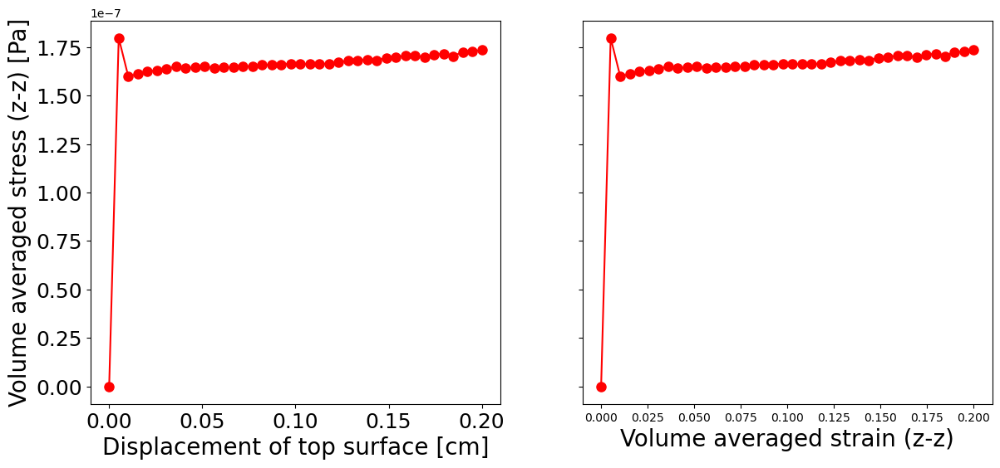

In [45]:
avg_stresses = np.array(avg_stresses)
avg_strains = np.array(avg_strains)
print(avg_strains.shape)

csp, csr, kp, kr = soundspeedPD08()
print(f"Pressure force sound speed (m/s): {csp/uc.cm:.2e}")
print(f"Elastic rolling force sound speed (m/s): {csr/uc.cm:.2e}")

# Plot the volume-averaged stress versus the vertical displacement of the top surface.
fig, axs = plt.subplots(1, 2,figsize=(14, 6), sharey=True)

axs[0].plot(-1*disps, -1*avg_stresses[:, 2, 2], color='red', marker='o', markersize=8, linestyle='-') 
axs[0].set_xlabel(r'Displacement of top surface [cm]', fontsize=20)
axs[0].set_ylabel(r'Volume averaged stress (z-z) [Pa]', fontsize=20)
axs[0].tick_params(labelsize=18)

axs[1].plot(-1*avg_strains[:,2,2], -1*avg_stresses[:, 2, 2], color='red', marker='o', markersize=8, linestyle='-') 
axs[1].set_xlabel(r'Volume averaged strain (z-z)', fontsize=20)

plt.savefig(f"stress-strain-{test_num}.png")

plt.show()

In [ ]:
problem.fe.JxW.shape

(1000, 8)

In [ ]:
problem.density

Array([[0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076],
       [0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084],
       [0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076, 0.00076],
       [0.00081, 0.00081, 0.00081, 0.00081, 0.00081, 0.00081, 0.00081, 0.00081],
       [0.00077, 0.00077, 0.00077, 0.00077, 0.00077, 0.00077, 0.00077, 0.00077],
       [0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 ],
       [0.00079, 0.00079, 0.00079, 0.00079, 0.00079, 0.00079, 0.00079, 0.00079],
       [0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084, 0.00084],
       [0.00085, 0.00085, 0.00085, 0.00085, 0.00085, 0.00085, 0.00085, 0.00085],
       [0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 , 0.0008 ],
       [0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088],
       [0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088, 0.00088],
       [0.00102, 0.00102, 0.

In [ ]:
problem.density.shape

(1000, 8)